/var/folders/0j/8rw9s9dd56v924gjnszhk07m0000gn/T/ipykernel_11701/1935902113.py:114: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  freqs_tensor = torch.tensor(freqs, dtype=torch.float32, device=device)
/Users/xuenbei/Desktop/finalyearproject/spDCM/spdcm_parallel.py:55: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.k1 = torch.tensor(4.3 * self.theta0 * self.E0.item() * self.TE, device=device)
/Users/xuenbei/Desktop/finalyearproject/spDCM/spdcm_parallel.py:56: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.k2 = torch.tensor(self.eps

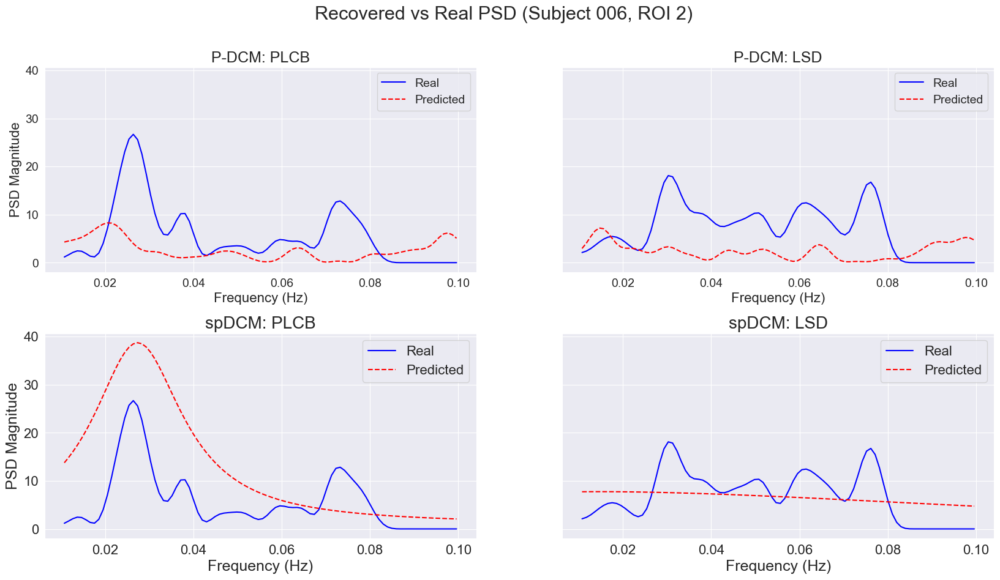

In [ ]:
from PDCM.euler_maruyama import simulate_bold_euler_maruyama
import os
import json
import torch
import matplotlib.pyplot as plt

from helper_functions import load_single_time_series, filter_frequencies
from scipy_to_torch import torch_csd
from PDCM.PDCMBOLDModel import PDCMMODEL
from spDCM.spDCM_Model import compute_csd
from spDCM.spdcm_parallel import spDCMTrainableAll

subject_id = 6
roi_index = 2
conditions = ["PLCB", "LSD"]
fs = 0.5
h = 0.01
padded_id = f"{subject_id:03d}"
base_path = "/Users/xuenbei/Desktop/finalyearproject"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Create 2x2 grid 
fig, axes = plt.subplots(2, 2, figsize=(20, 10), sharey=True)
plt.subplots_adjust(hspace=0.3)
fig.suptitle(f"Recovered vs Real PSD (Subject {padded_id}, ROI {roi_index})", fontsize=22)

# Top Row: P-DCM
for idx, cond in enumerate(conditions):
    ax = axes[0, idx]

    # Load real BOLD
    ts_path = f"{base_path}/time_series/sub-{padded_id}-{cond}-ROI{roi_index}.txt"
    real_bold = torch.tensor(load_single_time_series(ts_path), dtype=torch.float32)
    real_bold = real_bold / real_bold.std()

    # Load model params
    results_path = f"{base_path}/PDCM/fitted_data/sub-{padded_id}/roi-{roi_index}-{cond}_results.json"
    with open(results_path, 'r') as f:
        result_data = json.load(f)
    params = {k: float(v) for k, v in result_data["final_parameters"].items()}

    # Rebuild model
    model = PDCMMODEL(
        ignore_range=True,
        phi=params['phi'], varphi=params['varphi'], chi=params['chi'],
        mtt=params['mtt'], tau=params['tau'], sigma=params['sigma'],
        mu=params['mu'], lamb=params['lamb'], alpha=params['alpha'], E0=params['E0'],
        device='cpu'
    )

    # Simulate predicted BOLD
    t_sim = torch.arange(0, len(real_bold) * 2, h)
    _, pred_bold = simulate_bold_euler_maruyama(
        model=model, time=t_sim, h=h,
        alpha_v=params["alpha_v"], beta_v=params["beta_v"],
        alpha_e=params["alpha_e"], beta_e=params["beta_e"],
        desired_TR=2.0, add_state_noise=True, add_obs_noise=True
    )

    real_bold = real_bold.detach().cpu()
    pred_bold = pred_bold.detach().cpu()
    pred_bold = pred_bold / pred_bold.std()

    f1, csd_real = torch_csd(real_bold, real_bold, fs=fs, nperseg=128, nfft=512)
    f1, csd_real = filter_frequencies(f1, csd_real, 0.01, 0.1)
    f2, csd_pred = torch_csd(pred_bold, pred_bold, fs=fs, nperseg=128, nfft=512)
    f2, csd_pred = filter_frequencies(f2, csd_pred, 0.01, 0.1)

    # Magnitudes
    true_mag = torch.sqrt(csd_real.real**2 + csd_real.imag**2).detach().cpu().numpy()
    pred_mag = torch.sqrt(csd_pred.real**2 + csd_pred.imag**2).detach().cpu().numpy()

    ax.plot(f1, true_mag, label="Real", color="blue")
    ax.plot(f2, pred_mag, label="Predicted", linestyle="--", color="red")
    ax.set_title(f"P-DCM: {cond}", fontsize=18)
    ax.set_xlabel("Frequency (Hz)", fontsize=16)
    if idx == 0:
        ax.set_ylabel("PSD Magnitude", fontsize=16)
    ax.tick_params(labelsize=14)
    ax.grid(True)
    ax.legend(fontsize=14)

# Bottom Row: spDCM
for idx, cond in enumerate(conditions):
    ax = axes[1, idx]

    # Load real BOLD
    ts_path = f"{base_path}/time_series/sub-{padded_id}-{cond}-ROI{roi_index}.txt"
    ts = load_single_time_series(ts_path)
    ts = torch.tensor(ts, dtype=torch.float32, device=device)
    ts = ts / ts.std()

    # Load model params
    results_path = f"{base_path}/spDCM/fitted_data/sub-{padded_id}/roi-{roi_index}-{cond}_results.json"
    with open(results_path, 'r') as f:
        result_data = json.load(f)
    params = result_data["final_parameters"]

    A = [[complex(a[0], a[1]) for a in row] for row in params["A"]]
    kwargs = dict(
        A=A,
        varphi=params["varphi"], phi=params["phi"], chi=params["chi"],
        mtt=params["mtt"], tau=params["tau"],
        alpha_v=params["alpha_v"], beta_v=params["beta_v"],
        alpha_e=params["alpha_e"], beta_e=params["beta_e"],
        alpha=params["alpha"], E0=params["E0"],
        theta0=40.3, TE=0.04, r0=15.0, epsilon=0.5
    )

    freqs, psd = torch_csd(ts, ts, fs=0.5, nperseg=128, nfft=512)
    freqs, psd = filter_frequencies(freqs, psd, min_freq=0.01, max_freq=0.1)
    freqs_tensor = torch.tensor(freqs, dtype=torch.float32, device=device)

    model = spDCMTrainableAll(**kwargs).to(device)

    with torch.no_grad():
        pred = compute_csd(model, freqs_tensor, model.alpha_v, model.beta_v,
                           model.alpha_e, model.beta_e, model.A, num_regions=1).squeeze().cpu()

    true_mag = torch.sqrt(psd.real**2 + psd.imag**2).detach().cpu().numpy()
    pred_mag = torch.sqrt(pred.real**2 + pred.imag**2).numpy()

    ax.plot(freqs, true_mag, label='Real', color="blue")
    ax.plot(freqs, pred_mag, label='Predicted', linestyle='--', color="red")
    ax.set_title(f"spDCM: {cond}", fontsize=20)
    ax.set_xlabel("Frequency (Hz)", fontsize=18)
    if idx == 0:
        ax.set_ylabel("PSD Magnitude", fontsize=18)
    ax.tick_params(labelsize=16)
    ax.grid(True)
    ax.legend(fontsize=16)

plt.show()


/var/folders/0j/8rw9s9dd56v924gjnszhk07m0000gn/T/ipykernel_11701/3530889645.py:97: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  freqs_tensor = torch.tensor(freqs, dtype=torch.float32, device=device)


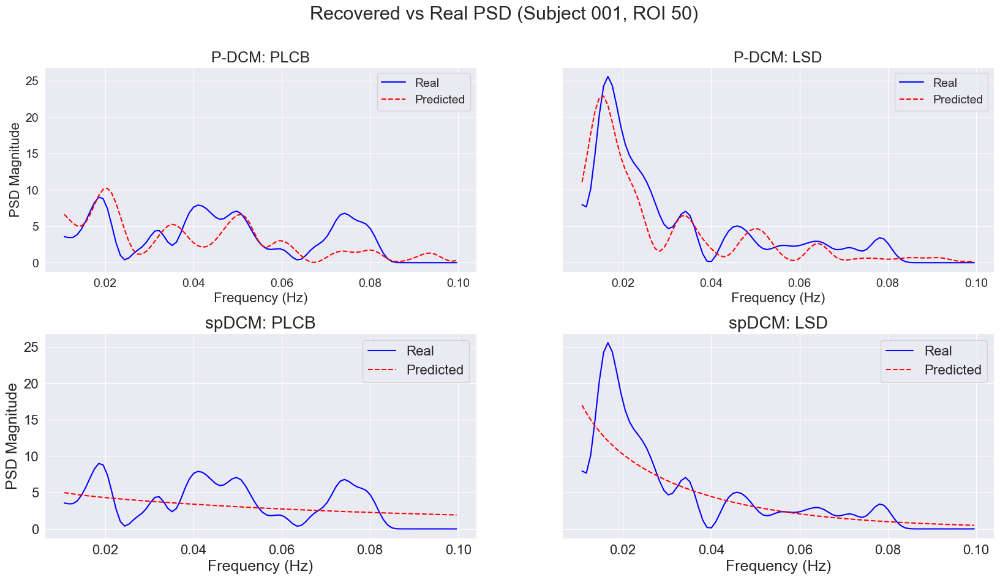

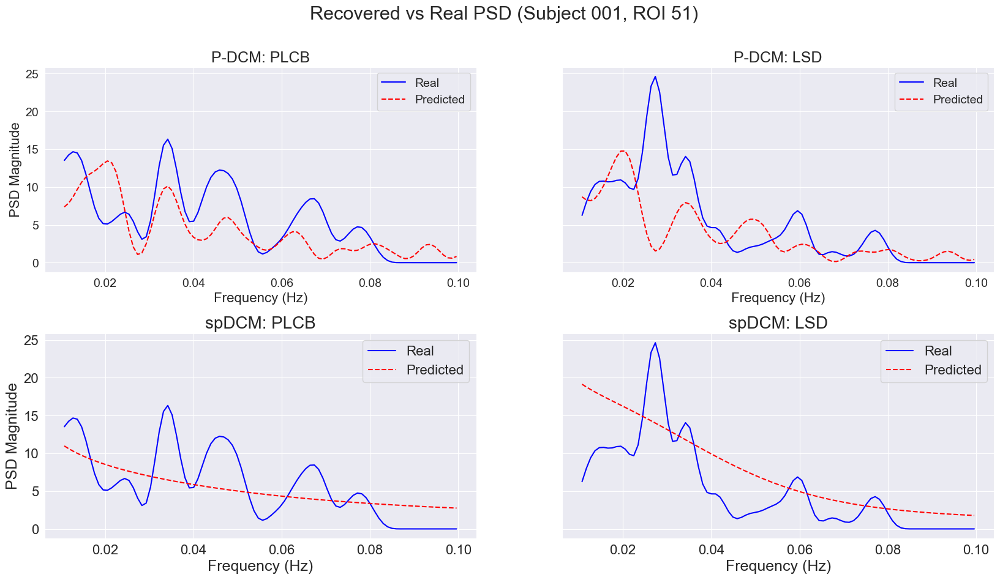

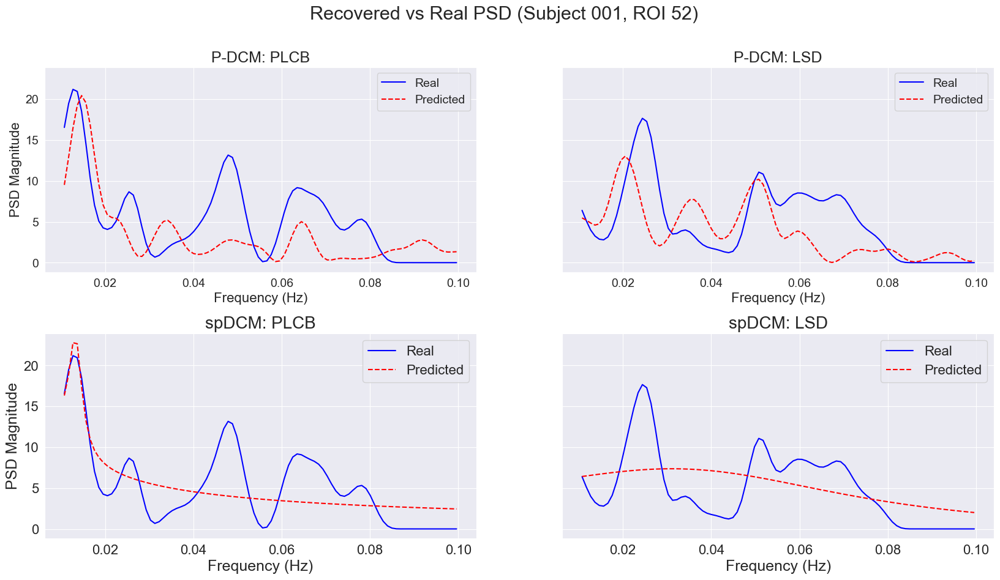

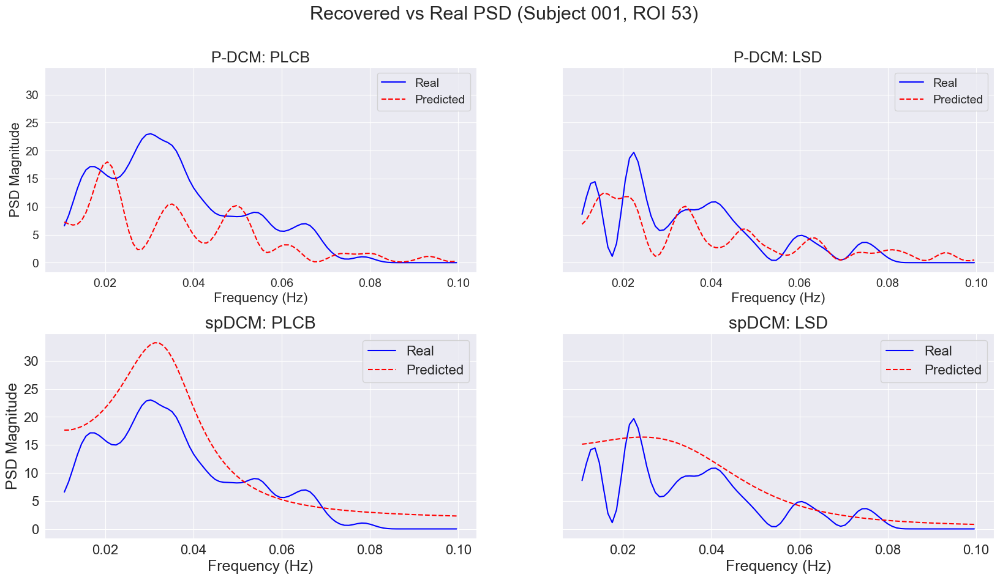

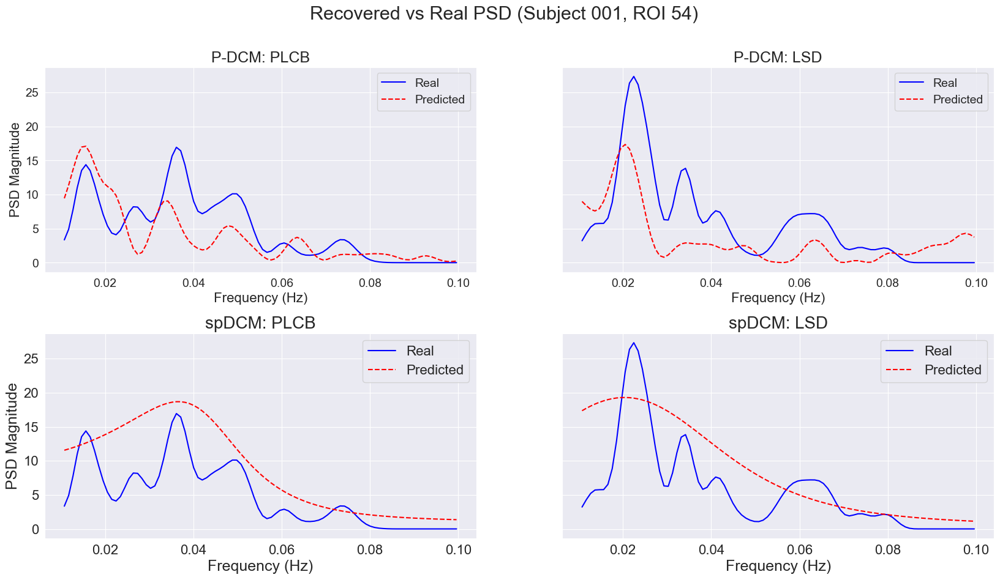

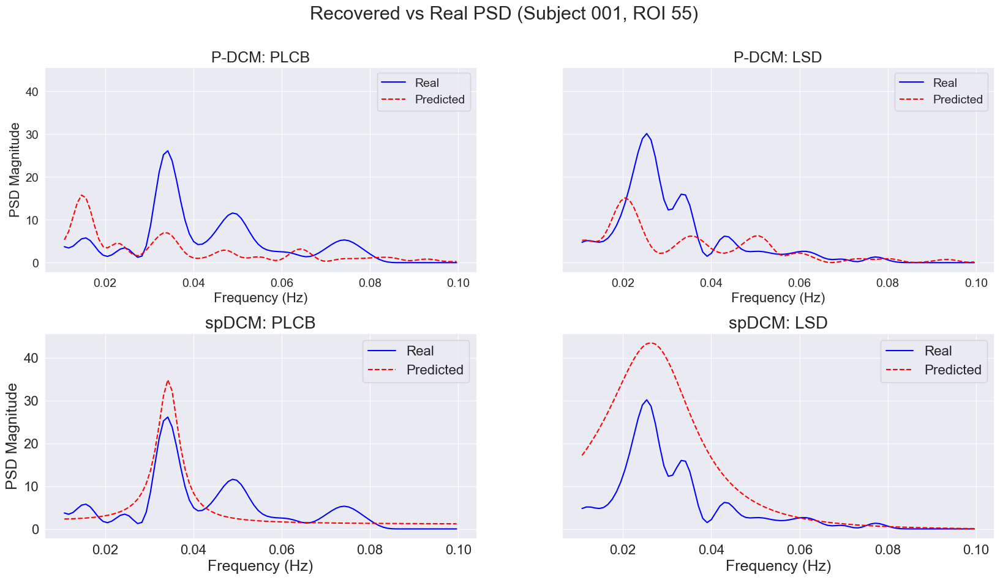

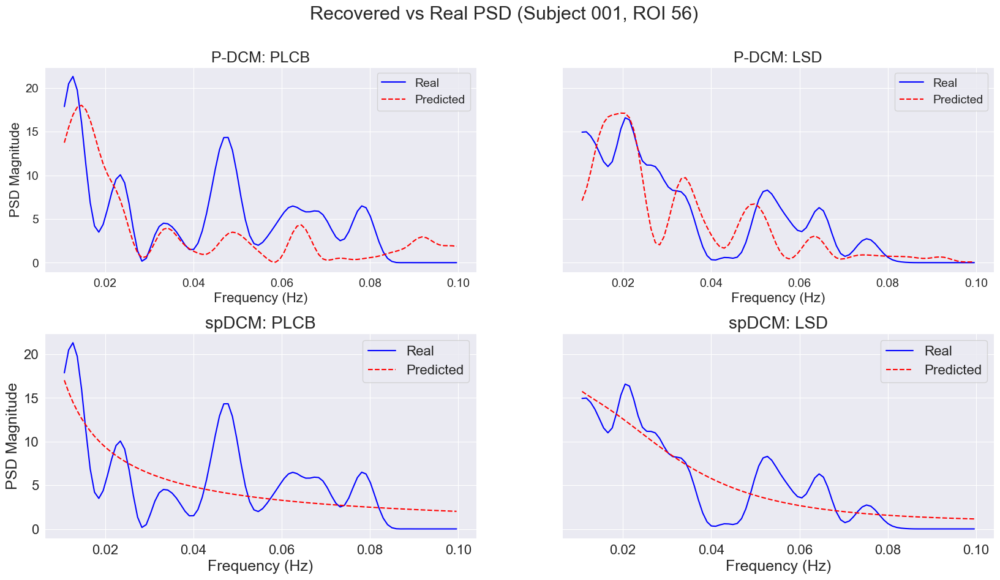

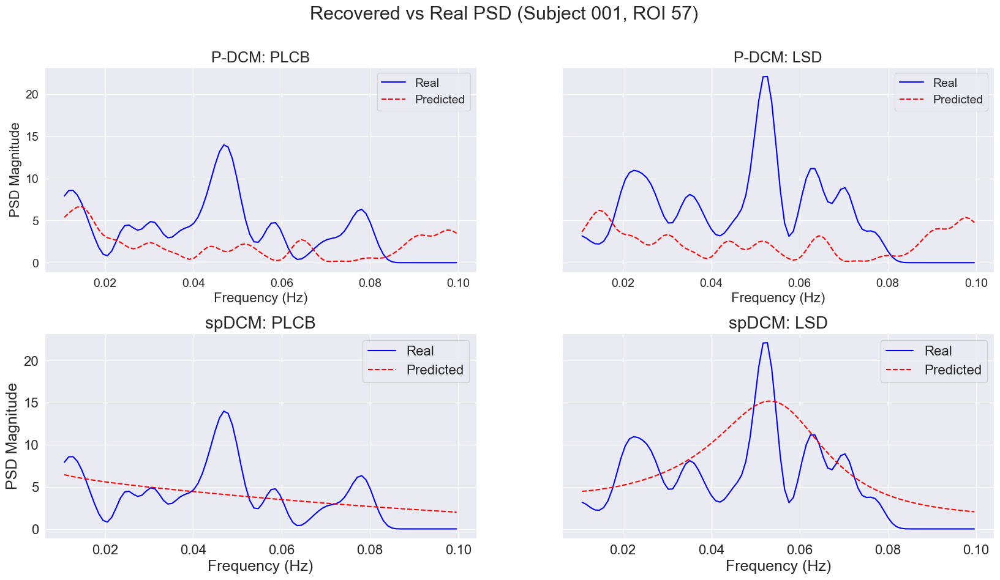

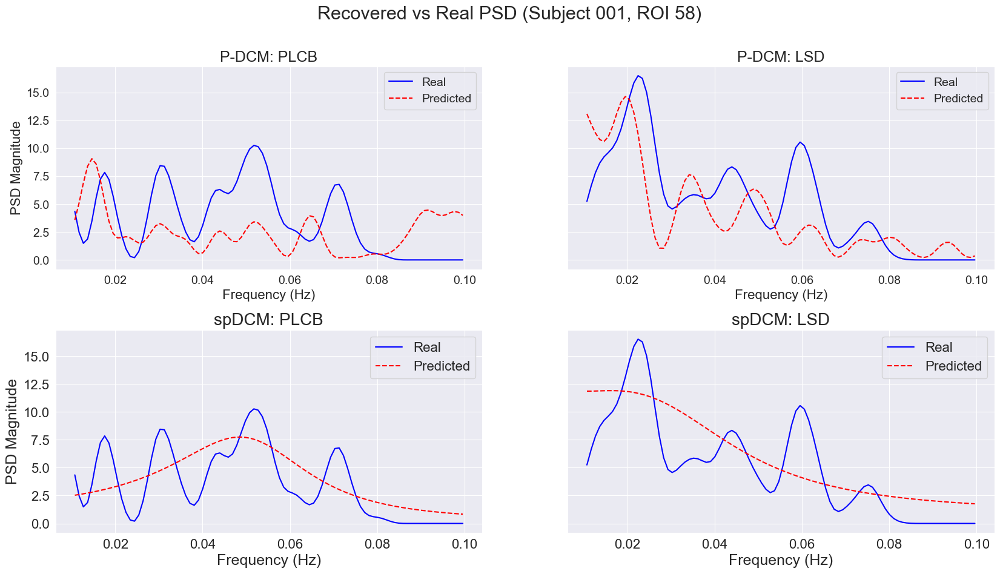

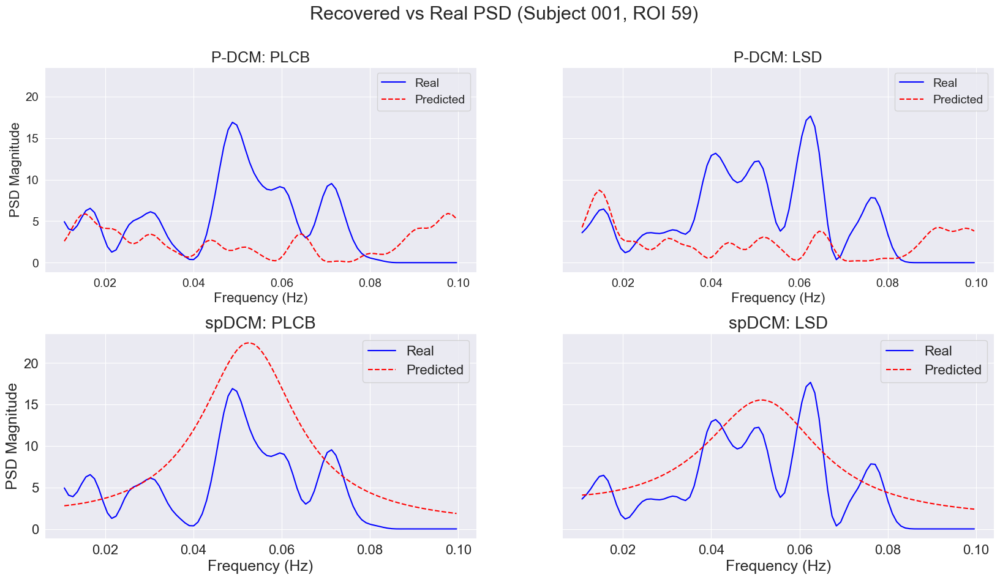

In [ ]:
from PDCM.euler_maruyama import simulate_bold_euler_maruyama
import os
import json
import torch
import matplotlib.pyplot as plt

from helper_functions import load_single_time_series, filter_frequencies
from scipy_to_torch import torch_csd
from PDCM.PDCMBOLDModel import PDCMMODEL
from spDCM.spDCM_Model import compute_csd
from spDCM.spdcm_parallel import spDCMTrainableAll


subject_id = 1
conditions = ["PLCB", "LSD"]
fs = 0.5
h = 0.01
padded_id = f"{subject_id:03d}"
base_path = "/Users/xuenbei/Desktop/finalyearproject"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Function to plot P-DCM
def plot_pdcm(ax, cond, roi_index):
    ts_path = f"{base_path}/time_series/sub-{padded_id}-{cond}-ROI{roi_index}.txt"
    real_bold = torch.tensor(load_single_time_series(ts_path), dtype=torch.float32)
    real_bold = real_bold / real_bold.std()

    results_path = f"{base_path}/PDCM/fitted_data/sub-{padded_id}/roi-{roi_index}-{cond}_results.json"
    with open(results_path, 'r') as f:
        result_data = json.load(f)
    params = {k: float(v) for k, v in result_data["final_parameters"].items()}

    model = PDCMMODEL(
        ignore_range=True,
        phi=params['phi'], varphi=params['varphi'], chi=params['chi'],
        mtt=params['mtt'], tau=params['tau'], sigma=params['sigma'],
        mu=params['mu'], lamb=params['lamb'], alpha=params['alpha'], E0=params['E0'],
        device='cpu'
    )

    t_sim = torch.arange(0, len(real_bold) * 2, h)
    _, pred_bold = simulate_bold_euler_maruyama(
        model=model, time=t_sim, h=h,
        alpha_v=params["alpha_v"], beta_v=params["beta_v"],
        alpha_e=params["alpha_e"], beta_e=params["beta_e"],
        desired_TR=2.0, add_state_noise=True, add_obs_noise=True
    )

    real_bold = real_bold.detach().cpu()
    pred_bold = pred_bold.detach().cpu()
    pred_bold = pred_bold / pred_bold.std()

    f1, csd_real = torch_csd(real_bold, real_bold, fs=fs, nperseg=128, nfft=512)
    f1, csd_real = filter_frequencies(f1, csd_real, 0.01, 0.1)
    f2, csd_pred = torch_csd(pred_bold, pred_bold, fs=fs, nperseg=128, nfft=512)
    f2, csd_pred = filter_frequencies(f2, csd_pred, 0.01, 0.1)

    true_mag = torch.sqrt(csd_real.real**2 + csd_real.imag**2).detach().cpu().numpy()
    pred_mag = torch.sqrt(csd_pred.real**2 + csd_pred.imag**2).detach().cpu().numpy()

    ax.plot(f1, true_mag, label="Real", color="blue")
    ax.plot(f2, pred_mag, label="Predicted", linestyle="--", color="red")
    ax.set_title(f"P-DCM: {cond}", fontsize=18)
    ax.set_xlabel("Frequency (Hz)", fontsize=16)
    ax.tick_params(labelsize=14)
    ax.grid(True)
    ax.legend(fontsize=14)

# Function to plot spDCM
def plot_spdcm(ax, cond, roi_index):
    ts_path = f"{base_path}/time_series/sub-{padded_id}-{cond}-ROI{roi_index}.txt"
    ts = load_single_time_series(ts_path)
    ts = torch.tensor(ts, dtype=torch.float32, device=device)
    ts = ts / ts.std()

    results_path = f"{base_path}/spDCM/fitted_data/sub-{padded_id}/roi-{roi_index}-{cond}_results.json"
    with open(results_path, 'r') as f:
        result_data = json.load(f)
    params = result_data["final_parameters"]

    A = [[complex(a[0], a[1]) for a in row] for row in params["A"]]
    kwargs = dict(
        A=A,
        varphi=params["varphi"], phi=params["phi"], chi=params["chi"],
        mtt=params["mtt"], tau=params["tau"],
        alpha_v=params["alpha_v"], beta_v=params["beta_v"],
        alpha_e=params["alpha_e"], beta_e=params["beta_e"],
        alpha=params["alpha"], E0=params["E0"],
        theta0=40.3, TE=0.04, r0=15.0, epsilon=0.5
    )

    freqs, psd = torch_csd(ts, ts, fs=0.5, nperseg=128, nfft=512)
    freqs, psd = filter_frequencies(freqs, psd, min_freq=0.01, max_freq=0.1)
    freqs_tensor = torch.tensor(freqs, dtype=torch.float32, device=device)

    model = spDCMTrainableAll(**kwargs).to(device)

    with torch.no_grad():
        pred = compute_csd(model, freqs_tensor, model.alpha_v, model.beta_v,
                           model.alpha_e, model.beta_e, model.A, num_regions=1).squeeze().cpu()

    true_mag = torch.sqrt(psd.real**2 + psd.imag**2).detach().cpu().numpy()
    pred_mag = torch.sqrt(pred.real**2 + pred.imag**2).numpy()

    ax.plot(freqs, true_mag, label='Real', color="blue")
    ax.plot(freqs, pred_mag, label='Predicted', linestyle='--', color='red')
    ax.set_title(f"spDCM: {cond}", fontsize=20)
    ax.set_xlabel("Frequency (Hz)", fontsize=18)
    ax.tick_params(labelsize=16)
    ax.grid(True)
    ax.legend(fontsize=16)

# Main loop over ROIs
for roi_index in range(50, 60):  
    fig, axes = plt.subplots(2, 2, figsize=(20, 10), sharey=True)
    plt.subplots_adjust(hspace=0.3)
    fig.suptitle(f"Recovered vs Real PSD (Subject {padded_id}, ROI {roi_index})", fontsize=22)

    for idx, cond in enumerate(conditions):
        plot_pdcm(axes[0, idx], cond, roi_index)
        if idx == 0:
            axes[0, idx].set_ylabel("PSD Magnitude", fontsize=16)

    for idx, cond in enumerate(conditions):
        plot_spdcm(axes[1, idx], cond, roi_index)
        if idx == 0:
            axes[1, idx].set_ylabel("PSD Magnitude", fontsize=18)

    plt.show()


/var/folders/0j/8rw9s9dd56v924gjnszhk07m0000gn/T/ipykernel_11701/2721213283.py:95: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  freqs_tensor = torch.tensor(freqs, dtype=torch.float32, device=device)


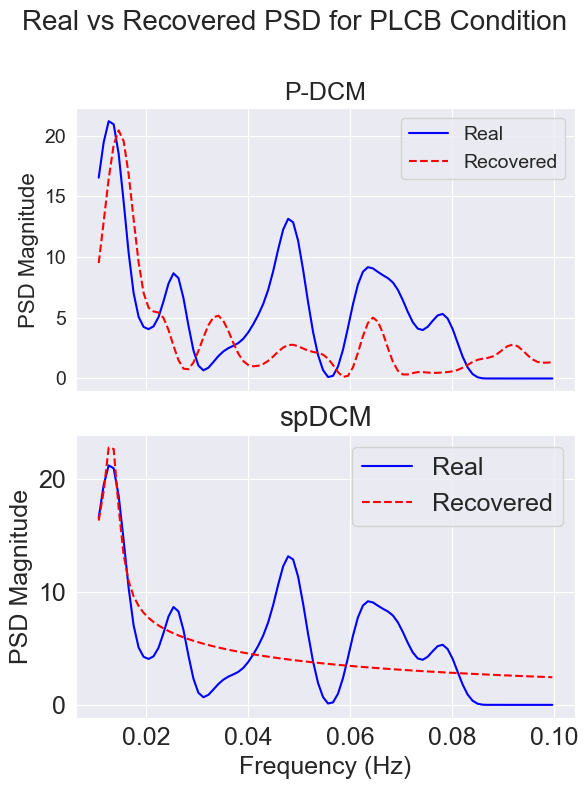

In [3]:
from PDCM.euler_maruyama import simulate_bold_euler_maruyama
import os
import json
import torch
import matplotlib.pyplot as plt

from helper_functions import load_single_time_series, filter_frequencies
from scipy_to_torch import torch_csd
from PDCM.PDCMBOLDModel import PDCMMODEL
from spDCM.spDCM_Model import compute_csd
from spDCM.spdcm_parallel import spDCMTrainableAll

subject_id = 1
roi_index = 52
condition = "PLCB"
fs = 0.5
h = 0.01
padded_id = f"{subject_id:03d}"
base_path = "/Users/xuenbei/Desktop/finalyearproject"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

fig, axes = plt.subplots(2, 1, figsize=(6, 8), sharex=True)
#fig.suptitle(f"Real vs Recovered PSD (Subject {padded_id}, ROI {roi_index}, Condition: {condition})", fontsize=18)


ax = axes[0]
ts_path = f"{base_path}/time_series/sub-{padded_id}-{condition}-ROI{roi_index}.txt"
real_bold = torch.tensor(load_single_time_series(ts_path), dtype=torch.float32)
real_bold = real_bold / real_bold.std()

results_path = f"{base_path}/PDCM/fitted_data/sub-{padded_id}/roi-{roi_index}-{condition}_results.json"
with open(results_path, 'r') as f:
    result_data = json.load(f)
params = {k: float(v) for k, v in result_data["final_parameters"].items()}

model = PDCMMODEL(
    ignore_range=True,
    phi=params['phi'], varphi=params['varphi'], chi=params['chi'],
    mtt=params['mtt'], tau=params['tau'], sigma=params['sigma'],
    mu=params['mu'], lamb=params['lamb'], alpha=params['alpha'], E0=params['E0'],
    device='cpu'
)

t_sim = torch.arange(0, len(real_bold) * 2, h)
_, pred_bold = simulate_bold_euler_maruyama(
    model=model, time=t_sim, h=h,
    alpha_v=params["alpha_v"], beta_v=params["beta_v"],
    alpha_e=params["alpha_e"], beta_e=params["beta_e"],
    desired_TR=2.0, add_state_noise=True, add_obs_noise=True
)

real_bold = real_bold.detach().cpu()
pred_bold = pred_bold.detach().cpu()
pred_bold = pred_bold / pred_bold.std()

f1, csd_real = torch_csd(real_bold, real_bold, fs=fs, nperseg=128, nfft=512)
f1, csd_real = filter_frequencies(f1, csd_real, 0.01, 0.1)
f2, csd_pred = torch_csd(pred_bold, pred_bold, fs=fs, nperseg=128, nfft=512)
f2, csd_pred = filter_frequencies(f2, csd_pred, 0.01, 0.1)

true_mag = torch.sqrt(csd_real.real**2 + csd_real.imag**2).detach().cpu().numpy()
pred_mag = torch.sqrt(csd_pred.real**2 + csd_pred.imag**2).detach().cpu().numpy()

ax.plot(f1, true_mag, label="Real", color="blue")
ax.plot(f2, pred_mag, label="Recovered", linestyle="--", color="red")
ax.set_title("P-DCM", fontsize=18)
ax.set_ylabel("PSD Magnitude", fontsize=16)
ax.tick_params(labelsize=14)
ax.grid(True)
ax.legend(fontsize=14)


ax = axes[1]
ts = torch.tensor(load_single_time_series(ts_path), dtype=torch.float32, device=device)
ts = ts / ts.std()

results_path = f"{base_path}/spDCM/fitted_data/sub-{padded_id}/roi-{roi_index}-{condition}_results.json"
with open(results_path, 'r') as f:
    result_data = json.load(f)
params = result_data["final_parameters"]

A = [[complex(a[0], a[1]) for a in row] for row in params["A"]]
kwargs = dict(
    A=A,
    varphi=params["varphi"], phi=params["phi"], chi=params["chi"],
    mtt=params["mtt"], tau=params["tau"],
    alpha_v=params["alpha_v"], beta_v=params["beta_v"],
    alpha_e=params["alpha_e"], beta_e=params["beta_e"],
    alpha=params["alpha"], E0=params["E0"],
    theta0=40.3, TE=0.04, r0=15.0, epsilon=0.5
)

freqs, psd = torch_csd(ts, ts, fs=0.5, nperseg=128, nfft=512)
freqs, psd = filter_frequencies(freqs, psd, min_freq=0.01, max_freq=0.1)
freqs_tensor = torch.tensor(freqs, dtype=torch.float32, device=device)

model = spDCMTrainableAll(**kwargs).to(device)

with torch.no_grad():
    pred = compute_csd(model, freqs_tensor, model.alpha_v, model.beta_v,
                       model.alpha_e, model.beta_e, model.A, num_regions=1).squeeze().cpu()

true_mag = torch.sqrt(psd.real**2 + psd.imag**2).detach().cpu().numpy()
pred_mag = torch.sqrt(pred.real**2 + pred.imag**2).numpy()

ax.plot(freqs, true_mag, label='Real', color="blue")
ax.plot(freqs, pred_mag, label='Recovered', linestyle='--', color="red")
ax.set_title("spDCM", fontsize=20)
ax.set_xlabel("Frequency (Hz)", fontsize=18)
ax.set_ylabel("PSD Magnitude", fontsize=18)
ax.tick_params(labelsize=18)
ax.grid(True)
ax.legend(fontsize=18)

plt.suptitle("Real vs Recovered PSD for PLCB Condition", fontsize = 20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


/var/folders/0j/8rw9s9dd56v924gjnszhk07m0000gn/T/ipykernel_11701/796698614.py:95: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  freqs_tensor = torch.tensor(freqs, dtype=torch.float32, device=device)


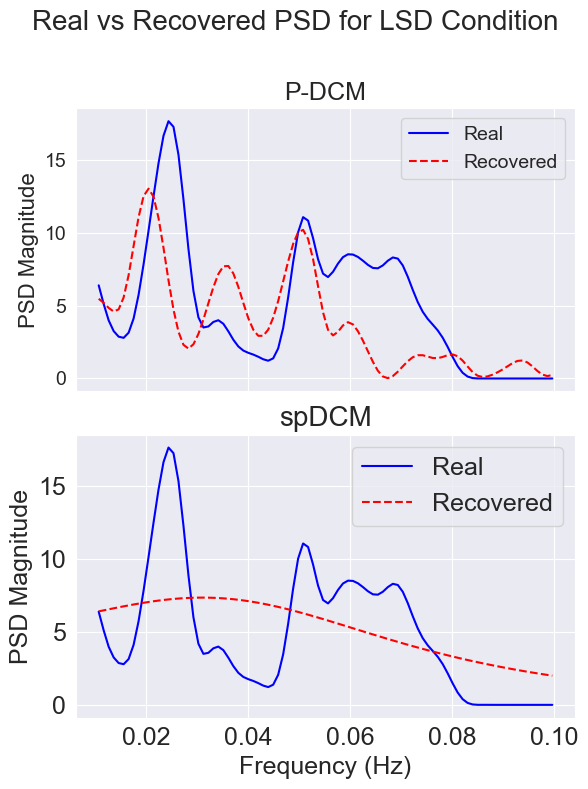

In [4]:
from PDCM.euler_maruyama import simulate_bold_euler_maruyama
import os
import json
import torch
import matplotlib.pyplot as plt

from helper_functions import load_single_time_series, filter_frequencies
from scipy_to_torch import torch_csd
from PDCM.PDCMBOLDModel import PDCMMODEL
from spDCM.spDCM_Model import compute_csd
from spDCM.spdcm_parallel import spDCMTrainableAll

subject_id = 1
roi_index = 52
condition = "LSD"
fs = 0.5
h = 0.01
padded_id = f"{subject_id:03d}"
base_path = "/Users/xuenbei/Desktop/finalyearproject"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

fig, axes = plt.subplots(2, 1, figsize=(6, 8), sharex=True)
#fig.suptitle(f"Real vs Recovered PSD (Subject {padded_id}, ROI {roi_index}, Condition: {condition})", fontsize=18)


ax = axes[0]
ts_path = f"{base_path}/time_series/sub-{padded_id}-{condition}-ROI{roi_index}.txt"
real_bold = torch.tensor(load_single_time_series(ts_path), dtype=torch.float32)
real_bold = real_bold / real_bold.std()

results_path = f"{base_path}/PDCM/fitted_data/sub-{padded_id}/roi-{roi_index}-{condition}_results.json"
with open(results_path, 'r') as f:
    result_data = json.load(f)
params = {k: float(v) for k, v in result_data["final_parameters"].items()}

model = PDCMMODEL(
    ignore_range=True,
    phi=params['phi'], varphi=params['varphi'], chi=params['chi'],
    mtt=params['mtt'], tau=params['tau'], sigma=params['sigma'],
    mu=params['mu'], lamb=params['lamb'], alpha=params['alpha'], E0=params['E0'],
    device='cpu'
)

t_sim = torch.arange(0, len(real_bold) * 2, h)
_, pred_bold = simulate_bold_euler_maruyama(
    model=model, time=t_sim, h=h,
    alpha_v=params["alpha_v"], beta_v=params["beta_v"],
    alpha_e=params["alpha_e"], beta_e=params["beta_e"],
    desired_TR=2.0, add_state_noise=True, add_obs_noise=True
)

real_bold = real_bold.detach().cpu()
pred_bold = pred_bold.detach().cpu()
pred_bold = pred_bold / pred_bold.std()

f1, csd_real = torch_csd(real_bold, real_bold, fs=fs, nperseg=128, nfft=512)
f1, csd_real = filter_frequencies(f1, csd_real, 0.01, 0.1)
f2, csd_pred = torch_csd(pred_bold, pred_bold, fs=fs, nperseg=128, nfft=512)
f2, csd_pred = filter_frequencies(f2, csd_pred, 0.01, 0.1)

true_mag = torch.sqrt(csd_real.real**2 + csd_real.imag**2).detach().cpu().numpy()
pred_mag = torch.sqrt(csd_pred.real**2 + csd_pred.imag**2).detach().cpu().numpy()

ax.plot(f1, true_mag, label="Real", color="blue")
ax.plot(f2, pred_mag, label="Recovered", linestyle="--", color="red")
ax.set_title("P-DCM", fontsize=18)
ax.set_ylabel("PSD Magnitude", fontsize=16)
ax.tick_params(labelsize=14)
ax.grid(True)
ax.legend(fontsize=14)


ax = axes[1]
ts = torch.tensor(load_single_time_series(ts_path), dtype=torch.float32, device=device)
ts = ts / ts.std()

results_path = f"{base_path}/spDCM/fitted_data/sub-{padded_id}/roi-{roi_index}-{condition}_results.json"
with open(results_path, 'r') as f:
    result_data = json.load(f)
params = result_data["final_parameters"]

A = [[complex(a[0], a[1]) for a in row] for row in params["A"]]
kwargs = dict(
    A=A,
    varphi=params["varphi"], phi=params["phi"], chi=params["chi"],
    mtt=params["mtt"], tau=params["tau"],
    alpha_v=params["alpha_v"], beta_v=params["beta_v"],
    alpha_e=params["alpha_e"], beta_e=params["beta_e"],
    alpha=params["alpha"], E0=params["E0"],
    theta0=40.3, TE=0.04, r0=15.0, epsilon=0.5
)

freqs, psd = torch_csd(ts, ts, fs=0.5, nperseg=128, nfft=512)
freqs, psd = filter_frequencies(freqs, psd, min_freq=0.01, max_freq=0.1)
freqs_tensor = torch.tensor(freqs, dtype=torch.float32, device=device)

model = spDCMTrainableAll(**kwargs).to(device)

with torch.no_grad():
    pred = compute_csd(model, freqs_tensor, model.alpha_v, model.beta_v,
                       model.alpha_e, model.beta_e, model.A, num_regions=1).squeeze().cpu()

true_mag = torch.sqrt(psd.real**2 + psd.imag**2).detach().cpu().numpy()
pred_mag = torch.sqrt(pred.real**2 + pred.imag**2).numpy()

ax.plot(freqs, true_mag, label='Real', color="blue")
ax.plot(freqs, pred_mag, label='Recovered', linestyle='--', color="red")
ax.set_title("spDCM", fontsize=20)
ax.set_xlabel("Frequency (Hz)", fontsize=18)
ax.set_ylabel("PSD Magnitude", fontsize=18)
ax.tick_params(labelsize=18)
ax.grid(True)
ax.legend(fontsize=18)

plt.suptitle("Real vs Recovered PSD for LSD Condition", fontsize = 20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


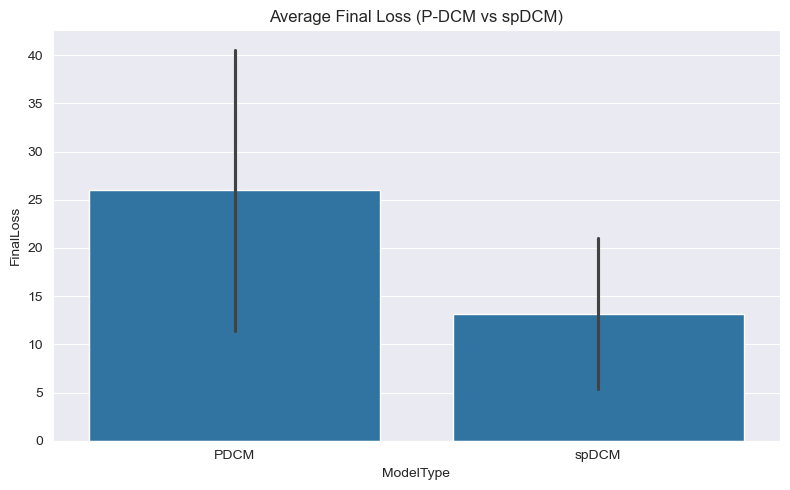

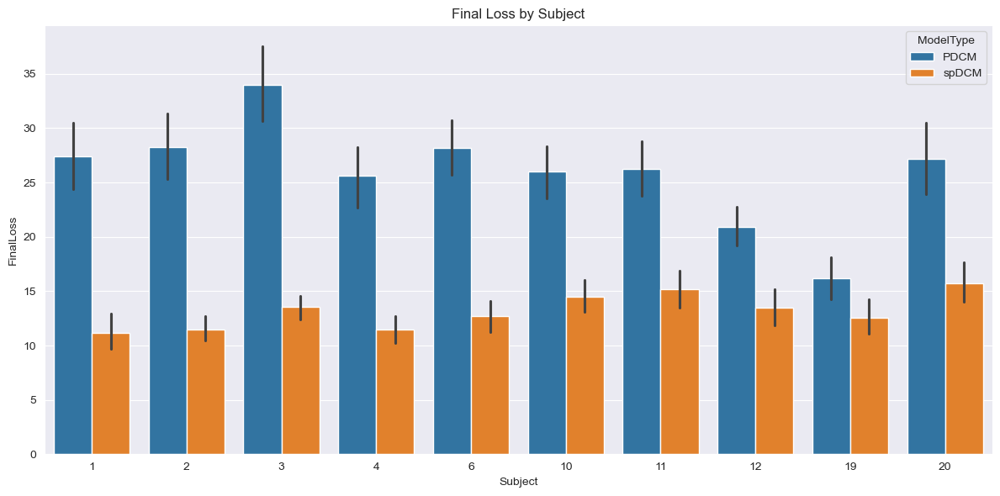

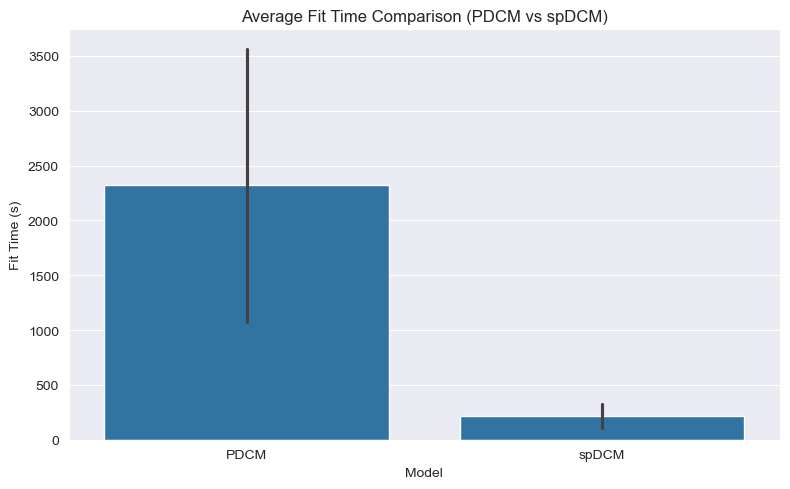

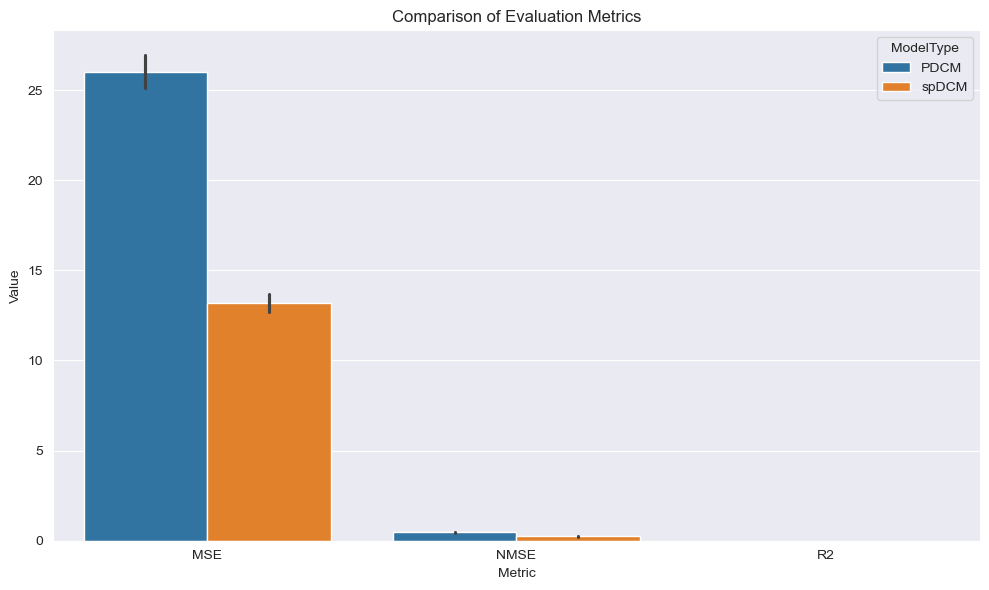

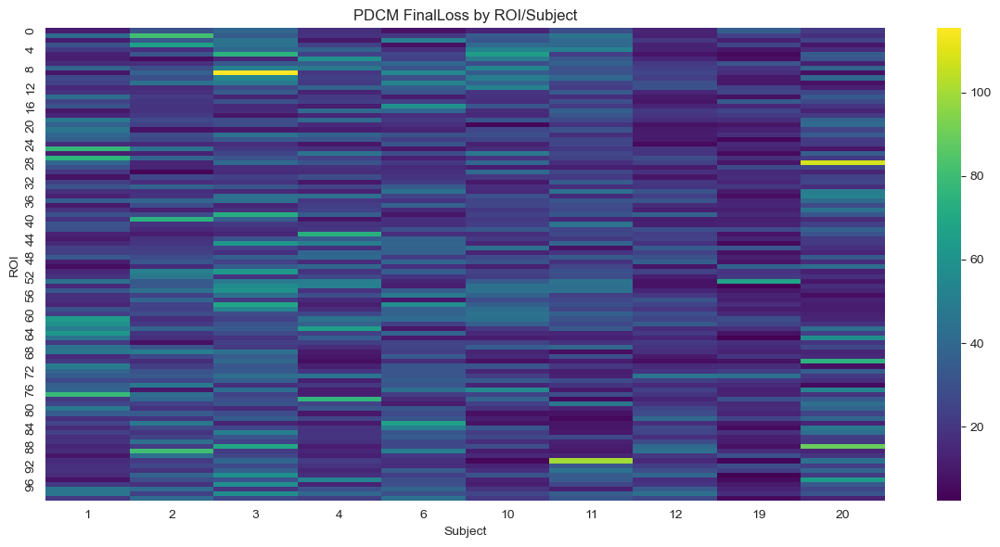

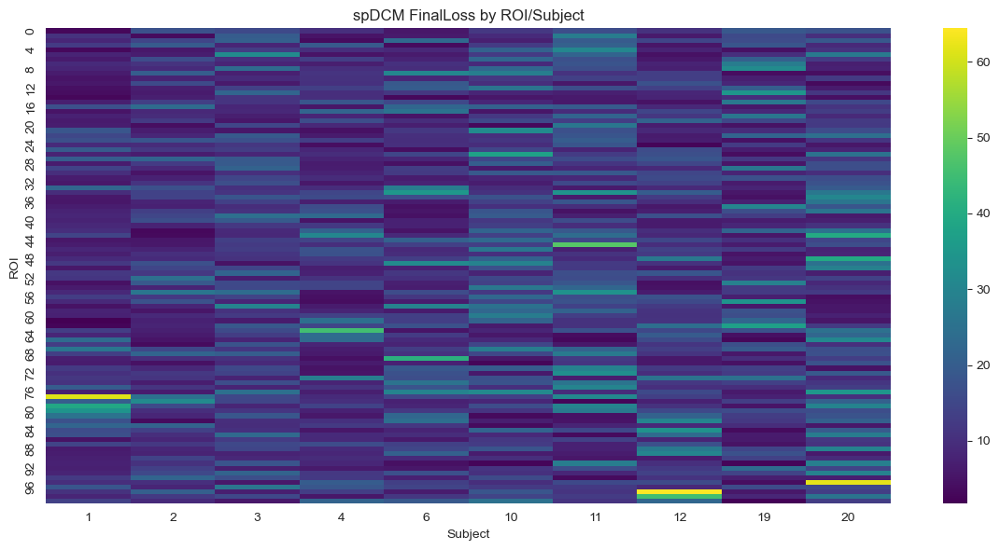

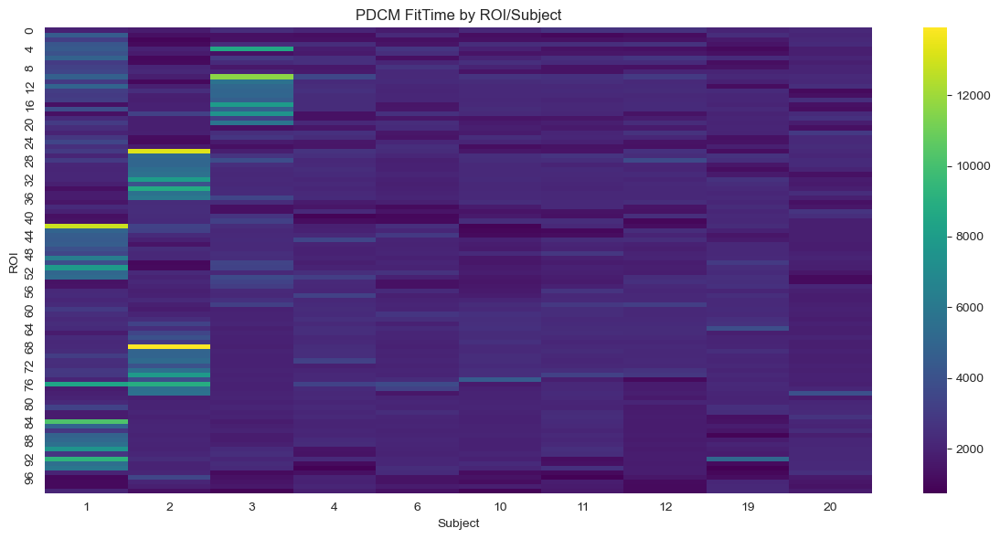

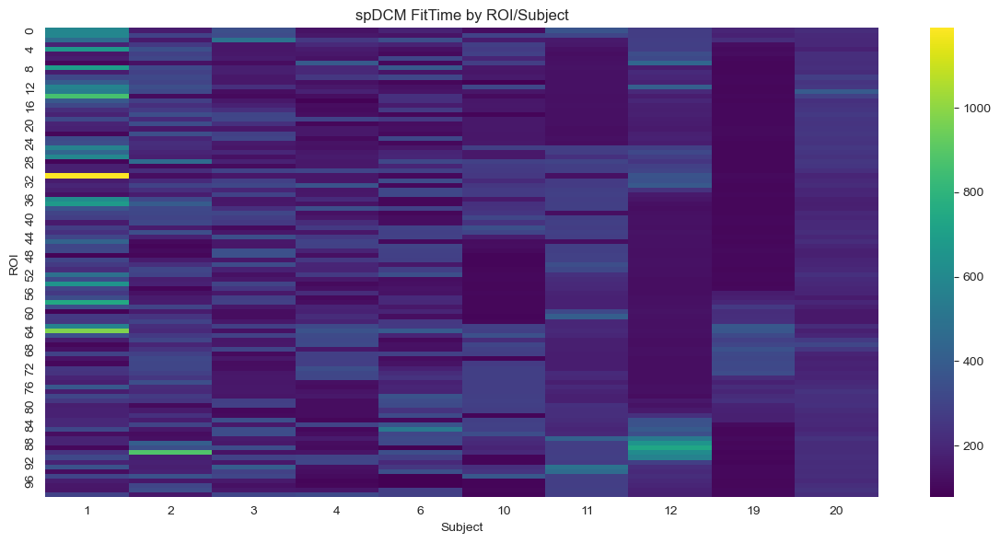

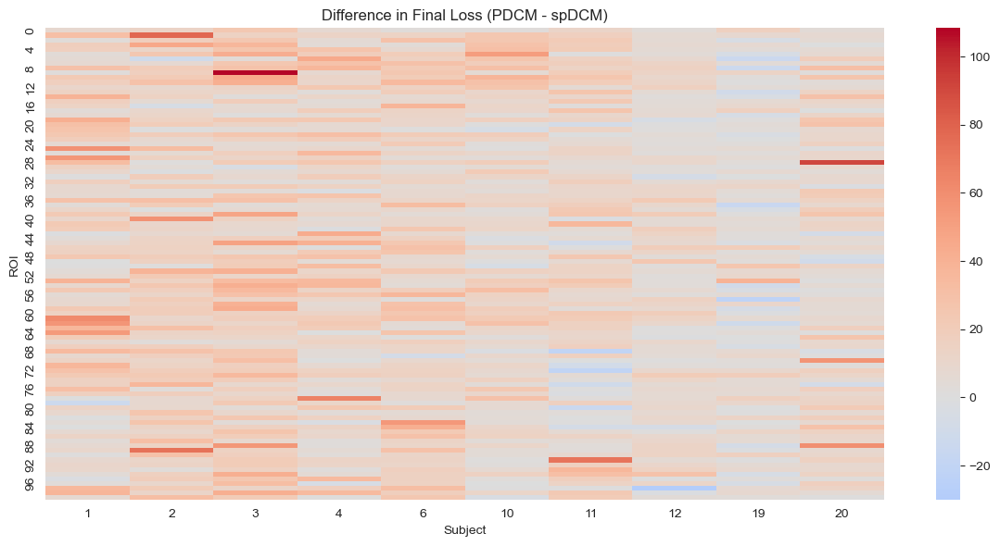

In [5]:
import os
import json
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pdcm_base = "/Users/xuenbei/Desktop/finalyearproject/PDCM/fitted_data"
spdcm_base = "/Users/xuenbei/Desktop/finalyearproject/spDCM/fitted_data"
subject_ids = [1, 2, 3, 4, 6, 10, 11, 12, 19, 20]
rois = list(range(100))
exp = "PLCB"

records = []

# Collect results
for model_type, base_path in [("PDCM", pdcm_base), ("spDCM", spdcm_base)]:
    for subject in subject_ids:
        for roi in rois:
            padded_id = f"{subject:03d}"
            prefix = f"roi-{roi}-{exp}"
            result_file = os.path.join(base_path, f"sub-{padded_id}", f"{prefix}_results.json")
            metrics_file = os.path.join(base_path, f"sub-{padded_id}", f"{prefix}_metrics.json")

            if not os.path.exists(result_file) or not os.path.exists(metrics_file):
                continue

            try:
                with open(result_file) as f:
                    result_data = json.load(f)
                with open(metrics_file) as f:
                    metric_data = json.load(f)

                records.append({
                    "Subject": subject,
                    "ROI": roi,
                    "ModelType": model_type,
                    "FinalLoss": result_data.get("final_loss"),
                    "FitTime": result_data.get("fit_time"),
                    "MSE": metric_data.get("raw_csd_metrics", {}).get("mse"),
                    "NMSE": metric_data.get("raw_csd_metrics", {}).get("nmse"),
                    "R2": metric_data.get("raw_csd_metrics", {}).get("r2")
                })
            except Exception as e:
                print(f"Error reading {prefix} for {model_type}: {e}")

df_combined = pd.DataFrame(records)

# Final Loss Barplot by Model
plt.figure(figsize=(8, 5))
sns.barplot(data=df_combined, x="ModelType", y="FinalLoss", errorbar="sd")
plt.title("Average Final Loss (P-DCM vs spDCM)")
plt.tight_layout()
plt.show()

# Final Loss by Subject
plt.figure(figsize=(12, 6))
sns.barplot(data=df_combined, x="Subject", y="FinalLoss", hue="ModelType")
plt.title("Final Loss by Subject")
plt.tight_layout()
plt.show()

# Fit Time by Model
plt.figure(figsize=(8, 5))
sns.barplot(data=df_combined, x="ModelType", y="FitTime", errorbar="sd")
plt.title("Average Fit Time Comparison (PDCM vs spDCM)")
plt.xlabel("Model")
plt.ylabel("Fit Time (s)") 
plt.tight_layout()
plt.show()


# Metric Scores
df_melt = df_combined.melt(
    id_vars=["Subject", "ROI", "ModelType"],
    value_vars=["MSE", "NMSE", "R2"],
    var_name="Metric",
    value_name="Value"
)

plt.figure(figsize=(10, 6))
sns.barplot(data=df_melt, x="Metric", y="Value", hue="ModelType")
plt.title("Comparison of Evaluation Metrics")
plt.tight_layout()
plt.show()

# Heatmaps by ROI/Subject
for metric in ["FinalLoss", "FitTime"]:
    for model in ["PDCM", "spDCM"]:
        data_pivot = df_combined[df_combined["ModelType"] == model].pivot(index="ROI", columns="Subject", values=metric)
        plt.figure(figsize=(12, 6))
        sns.heatmap(data_pivot, cmap="viridis", annot=False)
        plt.title(f"{model} {metric} by ROI/Subject")
        plt.tight_layout()
        plt.show()

# Heatmap of FinalLoss Difference (PDCM - spDCM)
loss_pdc = df_combined[df_combined["ModelType"] == "PDCM"].pivot(index="ROI", columns="Subject", values="FinalLoss")
loss_spd = df_combined[df_combined["ModelType"] == "spDCM"].pivot(index="ROI", columns="Subject", values="FinalLoss")

if not loss_pdc.empty and not loss_spd.empty:
    diff_matrix = loss_pdc - loss_spd
    plt.figure(figsize=(12, 6))
    sns.heatmap(diff_matrix, cmap="coolwarm", center=0)
    plt.title("Difference in Final Loss (PDCM - spDCM)")
    plt.tight_layout()
    plt.show()


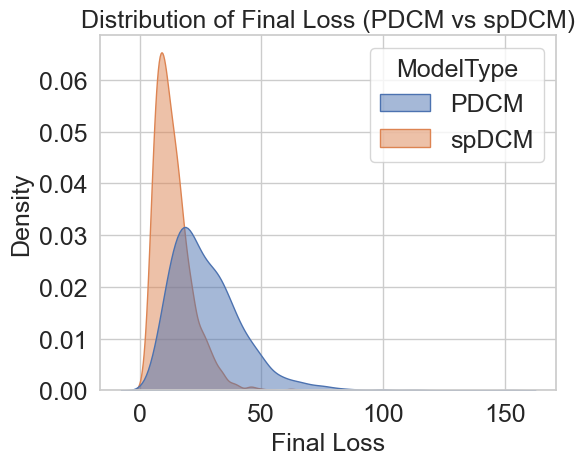

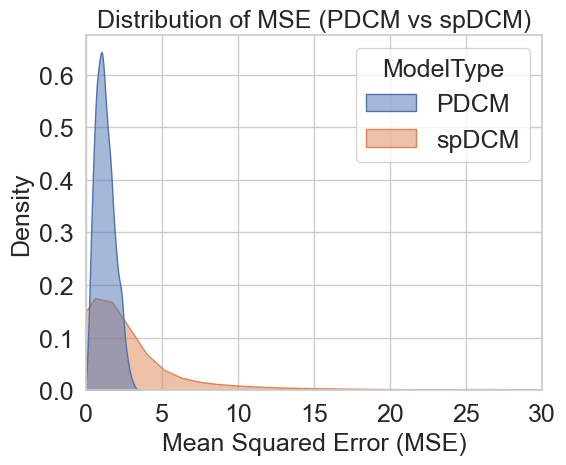

/var/folders/0j/8rw9s9dd56v924gjnszhk07m0000gn/T/ipykernel_11701/2373766908.py:84: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(fontsize=18)


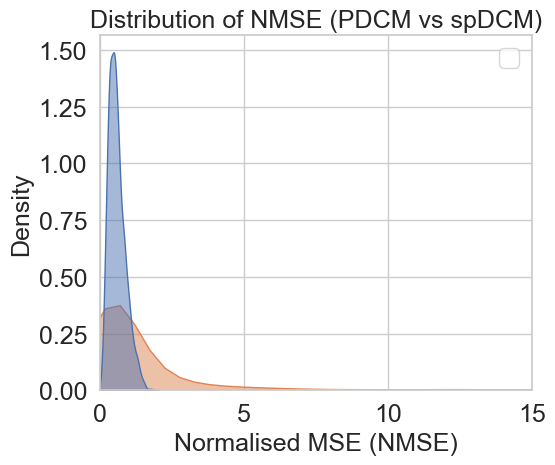

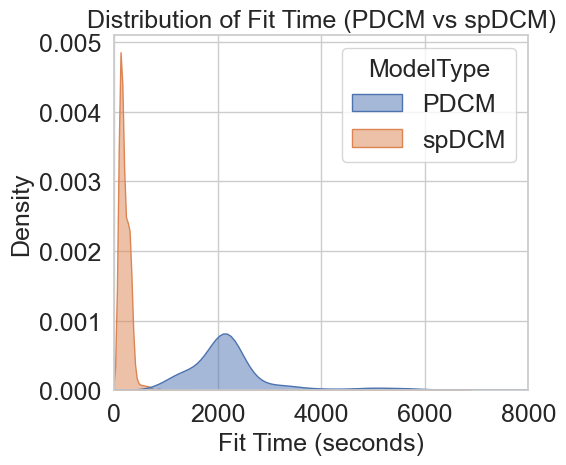

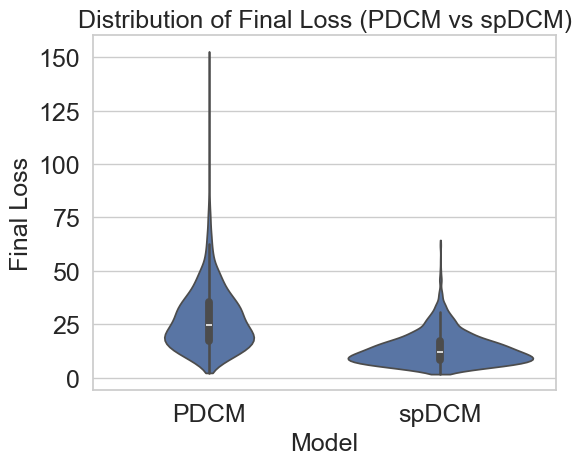

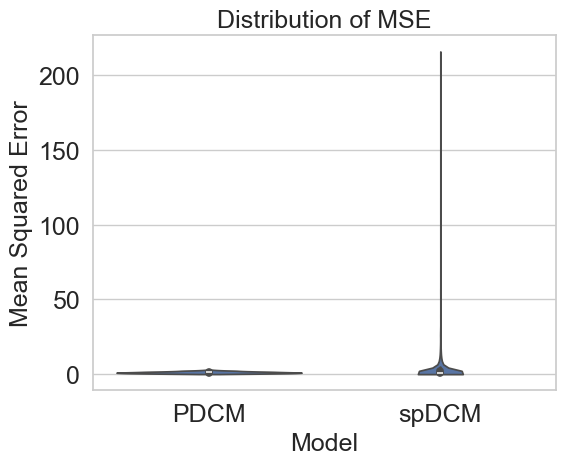

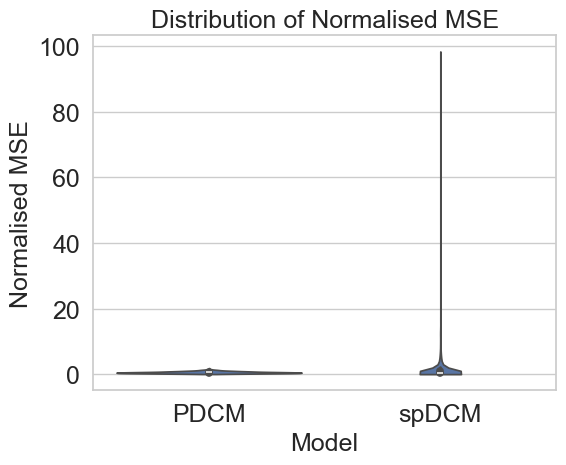

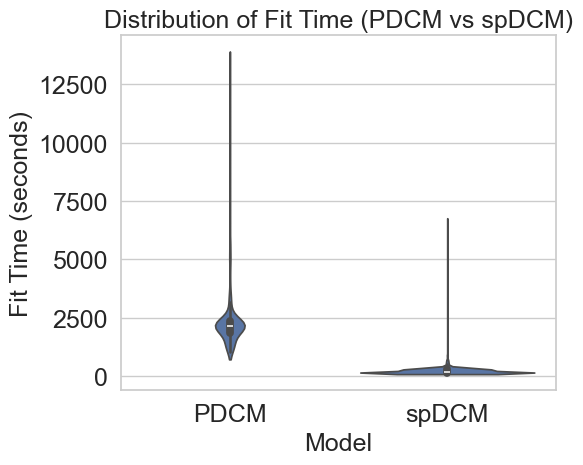

In [6]:
import os
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

pdcm_base = "/Users/xuenbei/Desktop/finalyearproject/PDCM/fitted_data"
spdcm_base = "/Users/xuenbei/Desktop/finalyearproject/spDCM/fitted_data"
subject_ids = [1, 2, 3, 4, 6, 10, 11, 12, 19, 20]
rois = list(range(100))
exp_list = ["PLCB", "LSD"]  

sns.set(style="whitegrid")
records = []


for model_type, base_path in [("PDCM", pdcm_base), ("spDCM", spdcm_base)]:
    for exp in exp_list:
        for subject in subject_ids:
            for roi in rois:
                padded_id = f"{subject:03d}"
                prefix = f"roi-{roi}-{exp}"
                result_path = os.path.join(base_path, f"sub-{padded_id}", f"{prefix}_results.json")
                metric_path = os.path.join(base_path, f"sub-{padded_id}", f"{prefix}_metrics.json")

                if not os.path.exists(result_path) or not os.path.exists(metric_path):
                    continue

                try:
                    with open(result_path, 'r') as f_res:
                        result_data = json.load(f_res)
                    with open(metric_path, 'r') as f_met:
                        metric_data = json.load(f_met)

                    records.append({
                        "Subject": subject,
                        "ROI": roi,
                        "ModelType": model_type,
                        "Experiment": exp,  
                        "FinalLoss": result_data.get("final_loss", None),
                        "FitTime": result_data.get("fit_time", None),
                        "MSE": metric_data.get("normalised_csd_metrics", {}).get("mse", None),
                        "NMSE": metric_data.get("normalised_csd_metrics", {}).get("nmse", None)
                    })
                except Exception as e:
                    print(f"Error reading files for {model_type}, Subject {subject}, ROI {roi}, Exp {exp}: {e}")

df = pd.DataFrame(records)
df = df.dropna(subset=["FinalLoss", "MSE", "NMSE", "FitTime"])
plt.rcParams.update({
    'legend.fontsize': 18,
    'legend.title_fontsize': 18,
    'font.size': 18,
    'axes.titlesize': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
})


# KDE Plot: Final Loss 
plt.figure(figsize=(6, 5))
sns.kdeplot(data=df, x="FinalLoss", hue="ModelType", fill=True, common_norm=False, alpha=0.5)
plt.title("Distribution of Final Loss (PDCM vs spDCM)")
plt.xlabel("Final Loss")
plt.tight_layout()
plt.show()

#  KDE Plot: MSE 
plt.figure(figsize=(6, 5))
sns.kdeplot(data=df, x="MSE", hue="ModelType", fill=True, common_norm=False, alpha=0.5)
plt.title("Distribution of MSE (PDCM vs spDCM)")
plt.xlabel("Mean Squared Error (MSE)")
plt.xlim([0,30])
plt.tight_layout()
plt.show()

#  KDE Plot: NMSE 
plt.figure(figsize=(6, 5))
sns.kdeplot(data=df, x="NMSE", hue="ModelType", fill=True, common_norm=False, alpha=0.5)
plt.title("Distribution of NMSE (PDCM vs spDCM)")
plt.xlabel("Normalised MSE (NMSE)")
plt.xlim([0,15])
plt.legend(fontsize=18)
plt.tight_layout()
plt.show()

#  KDE Plot: Fit Time
plt.figure(figsize=(6, 5))
sns.kdeplot(data=df, x="FitTime", hue="ModelType", fill=True, common_norm=False, alpha=0.5)
plt.title("Distribution of Fit Time (PDCM vs spDCM)")
plt.xlabel("Fit Time (seconds)")
plt.xlim([0,8000])
plt.tight_layout()
plt.show()

# Violin Plot: Final Loss 
plt.figure(figsize=(6, 5))
sns.violinplot(data=df, x="ModelType", y="FinalLoss", inner="box", cut=0)
plt.title("Distribution of Final Loss (PDCM vs spDCM)")
plt.ylabel("Final Loss")
plt.xlabel("Model")
plt.tight_layout()
plt.show()

# Violin Plot: MSE 
plt.figure(figsize=(6, 5))
sns.violinplot(data=df, x="ModelType", y="MSE", inner="box", cut=0)
plt.title("Distribution of MSE")
plt.ylabel("Mean Squared Error")
plt.xlabel("Model")
plt.tight_layout()
plt.show()

# Violin Plot: NMSE
plt.figure(figsize=(6, 5))
sns.violinplot(data=df, x="ModelType", y="NMSE", inner="box", cut=0)
plt.title("Distribution of Normalised MSE")
plt.ylabel("Normalised MSE")
plt.xlabel("Model")
plt.tight_layout()
plt.show()

#  Violin Plot: Fit Time 
plt.figure(figsize=(6, 5))
sns.violinplot(data=df, x="ModelType", y="FitTime", inner="box", cut=0)
plt.title("Distribution of Fit Time (PDCM vs spDCM)")
plt.ylabel("Fit Time (seconds)")
plt.xlabel("Model")
plt.tight_layout()
plt.show()


In [7]:
fit_time_stats = df.groupby('ModelType')['FitTime'].agg(['mean', 'median', 'std', 'count'])
print(fit_time_stats)

# Calculate ratio and difference between models 
pdcm_mean = fit_time_stats.loc['PDCM', 'mean']
spdcm_mean = fit_time_stats.loc['spDCM', 'mean']
ratio = pdcm_mean / spdcm_mean
difference = pdcm_mean - spdcm_mean

print(f"Mean fit time for P-DCM: {pdcm_mean:.2f} seconds")
print(f"Mean fit time for spDCM: {spdcm_mean:.2f} seconds")
print(f"P-DCM fit time is approximately {ratio:.1f} times longer than spDCM")
print(f"P-DCM fit time exceeds spDCM by about {difference:.2f} seconds on average")

from scipy.stats import mannwhitneyu

pdcm_times = df[df['ModelType'] == 'PDCM']['FitTime']
spdcm_times = df[df['ModelType'] == 'spDCM']['FitTime']
stat, p_value = mannwhitneyu(pdcm_times, spdcm_times, alternative='greater')
print(f"Mann-Whitney U test: statistic={stat}, p-value={p_value:.4e}")


                  mean       median          std  count
ModelType                                              
PDCM       2292.117355  2139.647784  1117.033544   2000
spDCM       204.701138   165.743915   194.841975   2000
Mean fit time for P-DCM: 2292.12 seconds
Mean fit time for spDCM: 204.70 seconds
P-DCM fit time is approximately 11.2 times longer than spDCM
P-DCM fit time exceeds spDCM by about 2087.42 seconds on average
Mann-Whitney U test: statistic=3995831.0, p-value=0.0000e+00



Condition: PLCB


/var/folders/0j/8rw9s9dd56v924gjnszhk07m0000gn/T/ipykernel_11701/1053225543.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cond[f"{param}_PDCM"] = pd.to_numeric(df_cond[f"{param}_PDCM"], errors='coerce')
/var/folders/0j/8rw9s9dd56v924gjnszhk07m0000gn/T/ipykernel_11701/1053225543.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cond[f"{param}_spDCM"] = pd.to_numeric(df_cond[f"{param}_spDCM"], errors='coerce')


   parameter  pearson_r  p_value
0         E0     0.0056   0.8354
1      alpha     0.0035   0.8955
2    alpha_e     0.0281   0.2965
3    alpha_v     0.0075   0.7817
4     beta_e     0.0146   0.5890
5     beta_v    -0.0604   0.0249
6        chi    -0.0175   0.5150
7        mtt    -0.0538   0.0454
8        phi    -0.0093   0.7297
9        tau     0.0419   0.1201
10    varphi    -0.0332   0.2172


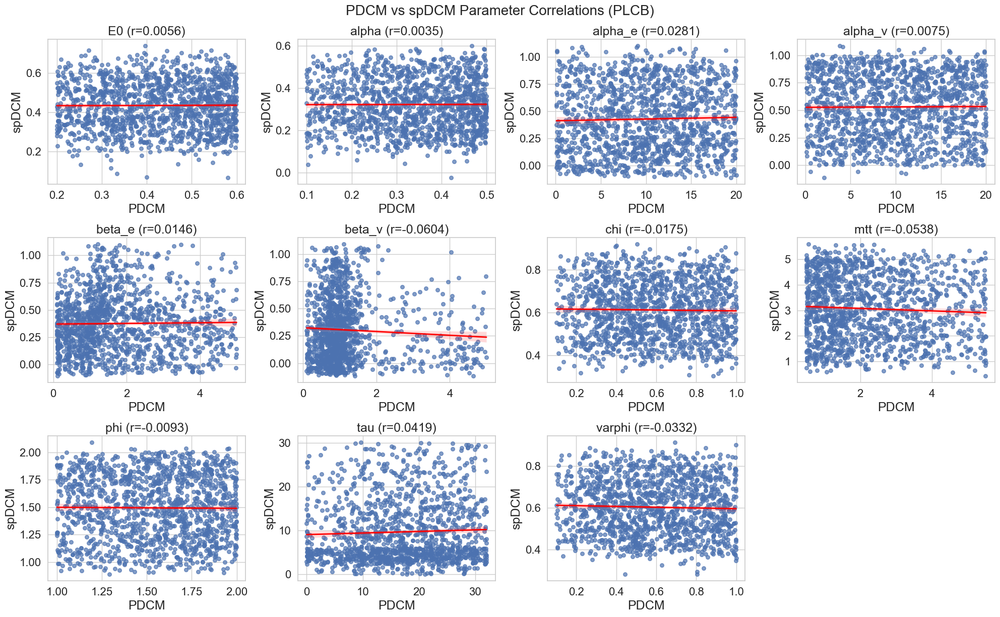


Condition: LSD
   parameter  pearson_r  p_value
0         E0    -0.0405   0.1325
1      alpha     0.0120   0.6554
2    alpha_e     0.0316   0.2407
3    alpha_v    -0.0205   0.4460
4     beta_e     0.0133   0.6217
5     beta_v    -0.1043   0.0001
6        chi    -0.0153   0.5699
7        mtt    -0.0440   0.1028
8        phi    -0.0172   0.5236
9        tau     0.0064   0.8120
10    varphi    -0.0467   0.0829


/var/folders/0j/8rw9s9dd56v924gjnszhk07m0000gn/T/ipykernel_11701/1053225543.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cond[f"{param}_PDCM"] = pd.to_numeric(df_cond[f"{param}_PDCM"], errors='coerce')
/var/folders/0j/8rw9s9dd56v924gjnszhk07m0000gn/T/ipykernel_11701/1053225543.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cond[f"{param}_spDCM"] = pd.to_numeric(df_cond[f"{param}_spDCM"], errors='coerce')


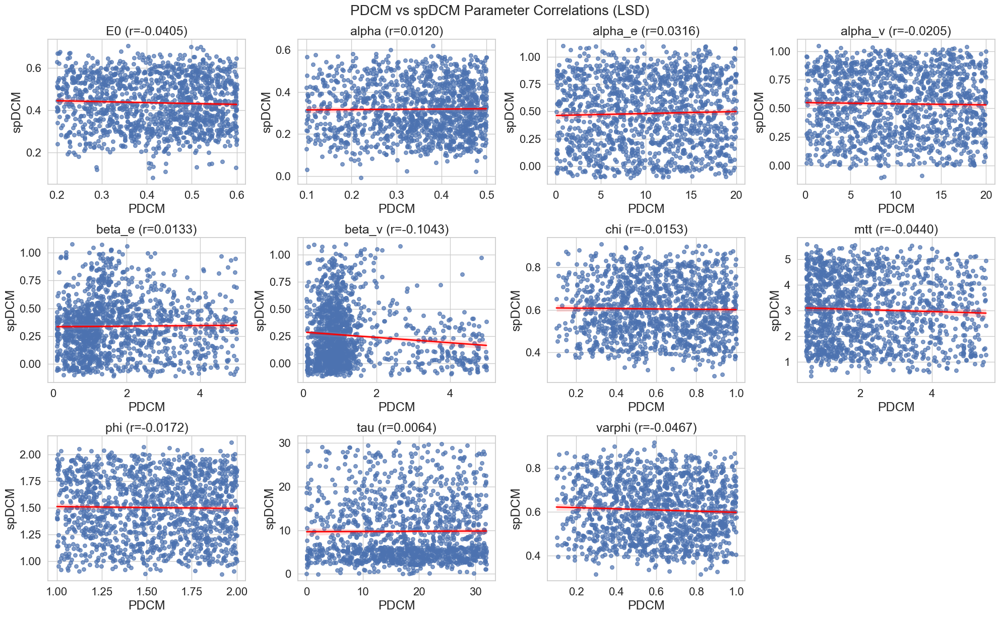

In [8]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

pdf = pd.read_csv("pdcm_all_data.csv")
sdf = pd.read_csv("spdcm_all_data.csv")

pdf = pdf[["subject", "roi", "experiment", "parameter", "value"]].dropna()
sdf = sdf[["subject", "roi", "experiment", "parameter", "value"]].dropna()

pdf_wide = pdf.pivot_table(index=["subject", "roi", "experiment"], columns="parameter", values="value").reset_index()
sdf_wide = sdf.pivot_table(index=["subject", "roi", "experiment"], columns="parameter", values="value").reset_index()

pdf_wide = pdf_wide.rename(columns={"experiment": "condition"})
sdf_wide = sdf_wide.rename(columns={"experiment": "condition"})

merged = pd.merge(
    pdf_wide, sdf_wide,
    on=["subject", "roi", "condition"],
    suffixes=('_PDCM', '_spDCM')
)

for cond in ["PLCB", "LSD"]:
    print(f"\nCondition: {cond}")
    df_cond = merged[merged["condition"] == cond]

    common_params = sorted(set(col.split('_PDCM')[0] for col in df_cond.columns if col.endswith('_PDCM')) &
                           set(col.split('_spDCM')[0] for col in df_cond.columns if col.endswith('_spDCM')))


    for param in common_params:
        df_cond[f"{param}_PDCM"] = pd.to_numeric(df_cond[f"{param}_PDCM"], errors='coerce')
        df_cond[f"{param}_spDCM"] = pd.to_numeric(df_cond[f"{param}_spDCM"], errors='coerce')

    correlations = []
    for param in common_params:
        x = df_cond[f"{param}_PDCM"]
        y = df_cond[f"{param}_spDCM"]
        valid = x.notna() & y.notna()
        x_valid = x[valid]
        y_valid = y[valid]

        if len(x_valid) > 1:
            r, p = pearsonr(x_valid, y_valid)
            correlations.append({
                "parameter": param,
                "pearson_r": round(r, 4),
                "p_value": round(p, 4)
            })

    correlation_df = pd.DataFrame(correlations)
    print(correlation_df)

    sns.set(style="whitegrid")
    n_params = len(common_params)
    n_cols = 4
    n_rows = (n_params + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
    axes = axes.flatten()

    plot_idx = 0
    for param in common_params:
        x = df_cond[f"{param}_PDCM"]
        y = df_cond[f"{param}_spDCM"]
        valid = x.notna() & y.notna()
        x_valid = x[valid]
        y_valid = y[valid]

        if len(x_valid) > 1:
            r, _ = pearsonr(x_valid, y_valid)
            sns.regplot(
                x=x_valid, y=y_valid, ax=axes[plot_idx],
                scatter_kws={'s': 30, 'alpha': 0.7},
                line_kws={'color': 'red', 'linewidth': 2}
            )
            axes[plot_idx].set_title(f"{param} (r={r:.4f})", fontsize=18)
            axes[plot_idx].set_xlabel("PDCM", fontsize=18)
            axes[plot_idx].set_ylabel("spDCM", fontsize=18)
            axes[plot_idx].tick_params(axis='both', labelsize=16)
            plot_idx += 1


    for j in range(plot_idx, len(axes)):
        fig.delaxes(axes[j])

    fig.tight_layout()
    plt.suptitle(f"PDCM vs spDCM Parameter Correlations ({cond})", fontsize=20, y=1.02)
    plt.show()


Correlation Table Across PLCB + LSD 
   parameter  pearson_r  p_value  n_pairs
0         E0    -0.0168   0.3769     2760
1      alpha     0.0069   0.7156     2760
2    alpha_e     0.0309   0.1051     2760
3    alpha_v    -0.0061   0.7495     2760
4     beta_e     0.0143   0.4533     2760
5     beta_v    -0.0853   0.0000     2760
6        chi    -0.0179   0.3464     2760
7        mtt    -0.0489   0.0103     2760
8        phi    -0.0134   0.4802     2760
9        tau     0.0244   0.2006     2760
10    varphi    -0.0393   0.0389     2760


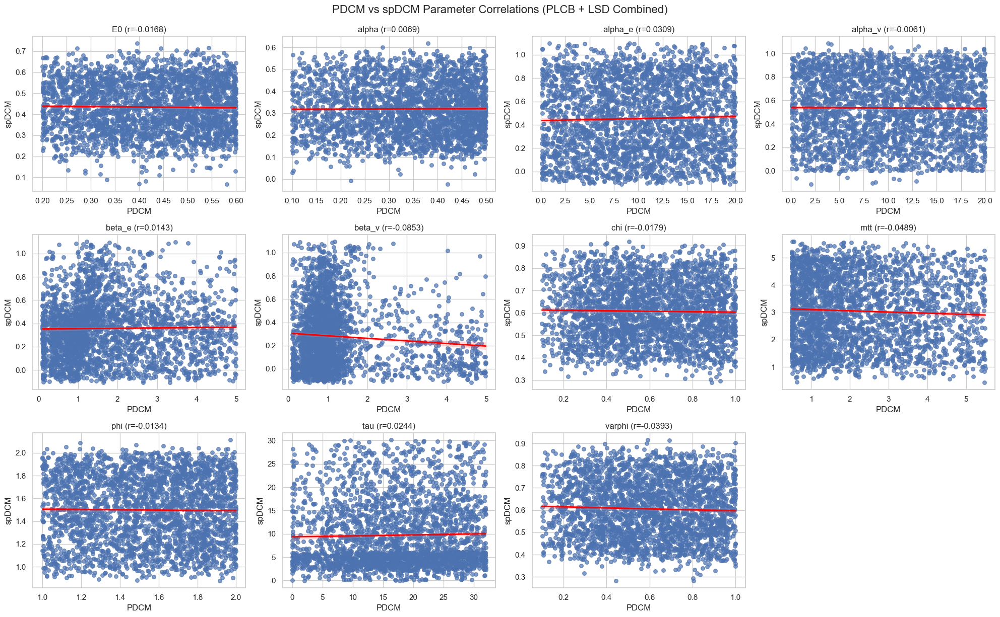

In [9]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

pdf = pd.read_csv("pdcm_all_data.csv")
sdf = pd.read_csv("spdcm_all_data.csv")


pdf = pdf[["subject", "roi", "experiment", "parameter", "value"]].dropna()
sdf = sdf[["subject", "roi", "experiment", "parameter", "value"]].dropna()


pdf_wide = pdf.pivot_table(index=["subject", "roi", "experiment"], columns="parameter", values="value").reset_index()
sdf_wide = sdf.pivot_table(index=["subject", "roi", "experiment"], columns="parameter", values="value").reset_index()


pdf_wide = pdf_wide.rename(columns={"experiment": "condition"})
sdf_wide = sdf_wide.rename(columns={"experiment": "condition"})


merged = pd.merge(
    pdf_wide, sdf_wide,
    on=["subject", "roi", "condition"],
    suffixes=('_PDCM', '_spDCM')
)


common_params = sorted(set(col.split('_PDCM')[0] for col in merged.columns if col.endswith('_PDCM')) &
                       set(col.split('_spDCM')[0] for col in merged.columns if col.endswith('_spDCM')))


for param in common_params:
    merged[f"{param}_PDCM"] = pd.to_numeric(merged[f"{param}_PDCM"], errors='coerce')
    merged[f"{param}_spDCM"] = pd.to_numeric(merged[f"{param}_spDCM"], errors='coerce')


correlations = []
for param in common_params:
    x = merged[f"{param}_PDCM"]
    y = merged[f"{param}_spDCM"]
    valid = x.notna() & y.notna()
    x_valid = x[valid]
    y_valid = y[valid]

    if len(x_valid) > 1:
        r, p = pearsonr(x_valid, y_valid)
        correlations.append({
            "parameter": param,
            "pearson_r": round(r, 4),
            "p_value": round(p, 4),
            "n_pairs": len(x_valid)
        })

correlation_df = pd.DataFrame(correlations)
print("Correlation Table Across PLCB + LSD ")
print(correlation_df)


sns.set(style="whitegrid")
n_params = len(common_params)
n_cols = 4
n_rows = (n_params + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()

plot_idx = 0
for param in common_params:
    x = merged[f"{param}_PDCM"]
    y = merged[f"{param}_spDCM"]
    valid = x.notna() & y.notna()
    x_valid = x[valid]
    y_valid = y[valid]

    if len(x_valid) > 1:
        r, _ = pearsonr(x_valid, y_valid)
        sns.regplot(
            x=x_valid, y=y_valid, ax=axes[plot_idx],
            scatter_kws={'s': 30, 'alpha': 0.7},
            line_kws={'color': 'red', 'linewidth': 2}
        )
        axes[plot_idx].set_title(f"{param} (r={r:.4f})")
        axes[plot_idx].set_xlabel("PDCM")
        axes[plot_idx].set_ylabel("spDCM")
        plot_idx += 1


for j in range(plot_idx, len(axes)):
    fig.delaxes(axes[j])

fig.tight_layout()
plt.suptitle("PDCM vs spDCM Parameter Correlations (PLCB + LSD Combined)", fontsize=16, y=1.02)
plt.show()


In [10]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr

# Identify common parameters 
common_params = sorted(set(col.split('_PDCM')[0] for col in merged.columns if col.endswith('_PDCM')) &
                       set(col.split('_spDCM')[0] for col in merged.columns if col.endswith('_spDCM')))

#Function to compute correlation for a given subset
def compute_correlation(df_subset, label):
    rows = []
    for param in common_params:
        x = df_subset[f"{param}_PDCM"]
        y = df_subset[f"{param}_spDCM"]
        valid = x.notna() & y.notna()
        x_valid = x[valid]
        y_valid = y[valid]

        if len(x_valid) > 1:
            r, p = pearsonr(x_valid, y_valid)
            rows.append({
                "parameter": param,
                "condition": label,
                "pearson_r": round(r, 4),
                "p_value": round(p, 4),
                "n": len(x_valid)
            })
    return pd.DataFrame(rows)

# Compute for each condition 
combined_df = compute_correlation(merged, "Combined")
plcb_df = compute_correlation(merged[merged["condition"] == "PLCB"], "PLCB")
lsd_df = compute_correlation(merged[merged["condition"] == "LSD"], "LSD")

comparison_df = pd.concat([combined_df, plcb_df, lsd_df], ignore_index=True)


pivot_r = comparison_df.pivot(index="parameter", columns="condition", values="pearson_r")
pivot_p = comparison_df.pivot(index="parameter", columns="condition", values="p_value")

print("Correlation coefficients:")
print(pivot_r)

print("\nP-values:")
print(pivot_p)


Correlation coefficients:
condition  Combined     LSD    PLCB
parameter                          
E0          -0.0168 -0.0405  0.0056
alpha        0.0069  0.0120  0.0035
alpha_e      0.0309  0.0316  0.0281
alpha_v     -0.0061 -0.0205  0.0075
beta_e       0.0143  0.0133  0.0146
beta_v      -0.0853 -0.1043 -0.0604
chi         -0.0179 -0.0153 -0.0175
mtt         -0.0489 -0.0440 -0.0538
phi         -0.0134 -0.0172 -0.0093
tau          0.0244  0.0064  0.0419
varphi      -0.0393 -0.0467 -0.0332

P-values:
condition  Combined     LSD    PLCB
parameter                          
E0           0.3769  0.1325  0.8354
alpha        0.7156  0.6554  0.8955
alpha_e      0.1051  0.2407  0.2965
alpha_v      0.7495  0.4460  0.7817
beta_e       0.4533  0.6217  0.5890
beta_v       0.0000  0.0001  0.0249
chi          0.3464  0.5699  0.5150
mtt          0.0103  0.1028  0.0454
phi          0.4802  0.5236  0.7297
tau          0.2006  0.8120  0.1201
varphi       0.0389  0.0829  0.2172


Paired t-test between P-DCM and spDCM parameter estimates:
   parameter  mean_PDCM  mean_spDCM   t_stat  p_value     n
0         E0   0.420267    0.434606  -4.4439   0.0000  2760
1      alpha   0.339459    0.320032   6.2113   0.0000  2760
2    alpha_e  10.091774    0.454263  90.9764   0.0000  2760
3    alpha_v   9.998289    0.535164  86.3928   0.0000  2760
4     beta_e   1.772097    0.357438  57.8689   0.0000  2760
5     beta_v   1.263949    0.278917  45.5869   0.0000  2760
6        chi   0.595085    0.608023  -2.5090   0.0122  2760
7        mtt   2.270591    3.045183 -21.0924   0.0000  2760
8        phi   1.533647    1.498131   4.4866   0.0000  2760
9        tau  17.295075    9.712529  36.1296   0.0000  2760
10    varphi   0.592033    0.606151  -2.7023   0.0069  2760


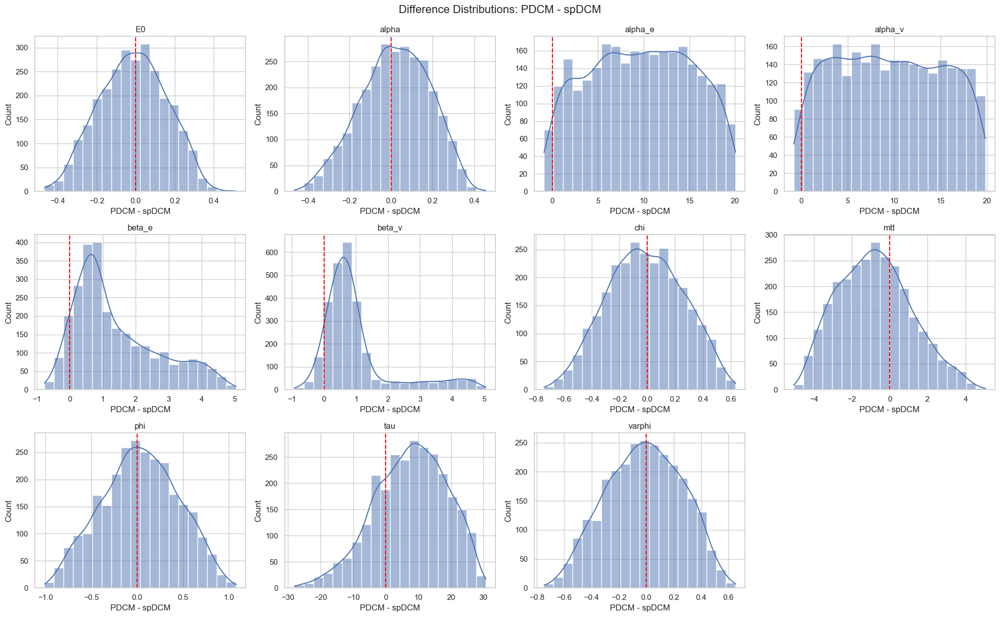

In [11]:
from scipy.stats import ttest_rel

#  Run paired t-tests and store differences 
results = []
diffs = {}  

for param in common_params:
    x = merged[f"{param}_PDCM"]
    y = merged[f"{param}_spDCM"]
    valid = x.notna() & y.notna()
    x_valid = x[valid]
    y_valid = y[valid]

    if len(x_valid) > 1:
        t_stat, p_val = ttest_rel(x_valid, y_valid)
        results.append({
            'parameter': param,
            'mean_PDCM': x_valid.mean(),
            'mean_spDCM': y_valid.mean(),
            't_stat': round(t_stat, 4),
            'p_value': round(p_val, 4),
            'n': len(x_valid)
        })
        diffs[param] = (x_valid - y_valid).to_numpy()


ttest_df = pd.DataFrame(results)
print("Paired t-test between P-DCM and spDCM parameter estimates:")
print(ttest_df)


sns.set(style="whitegrid")
n_params = len(diffs)
n_cols = 4
n_rows = (n_params + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()

for i, (param, diff_vals) in enumerate(diffs.items()):
    sns.histplot(diff_vals, bins=20, kde=True, ax=axes[i])
    axes[i].axvline(0, color='red', linestyle='--')
    axes[i].set_title(f"{param}")
    axes[i].set_xlabel("PDCM - spDCM")
    axes[i].set_ylabel("Count")

# Remove unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.tight_layout()
plt.suptitle("Difference Distributions: PDCM - spDCM", fontsize=16, y=1.02)
plt.show()

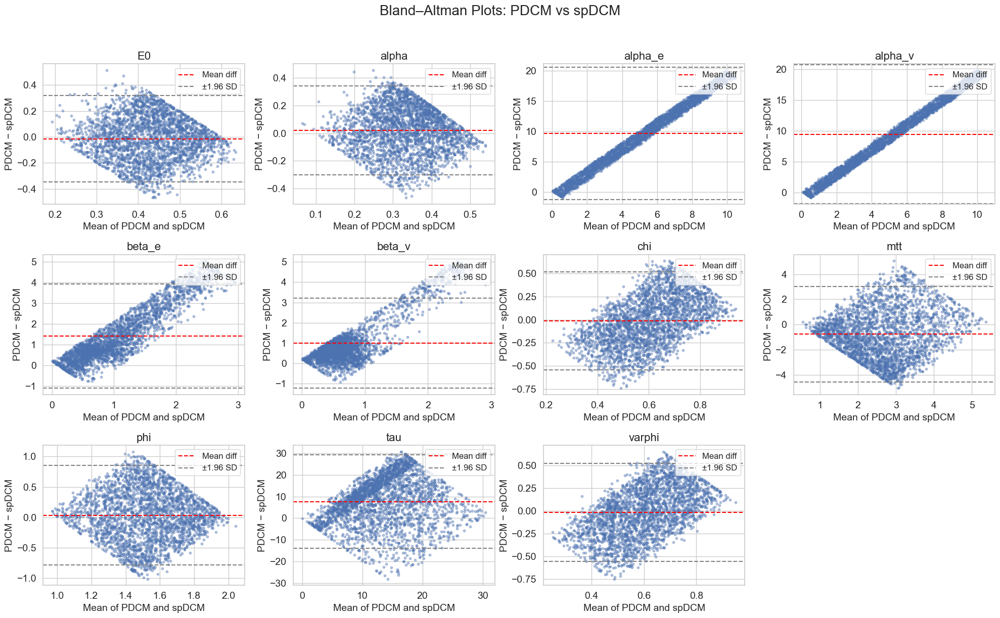

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
import matplotlib.pyplot as plt
import matplotlib as mpl

mpl.rcParams.update({
    'font.size': 14,          
    'axes.titlesize': 16,     
    'axes.labelsize': 14,     
    'xtick.labelsize': 14,    
    'ytick.labelsize': 14,   
    'legend.fontsize': 14,    
    'figure.titlesize': 18    
})

pdcm = pd.read_csv("pdcm_all_data.csv")
spdcm = pd.read_csv("spdcm_all_data.csv")

# Merge on subject, roi, experiment, and parameter
merged = pd.merge(
    pdcm, spdcm,
    on=["subject", "roi", "experiment", "parameter"],
    suffixes=("_PDCM", "_spDCM")
)


merged["value_PDCM"] = pd.to_numeric(merged["value_PDCM"], errors="coerce")
merged["value_spDCM"] = pd.to_numeric(merged["value_spDCM"], errors="coerce")
merged = merged.dropna(subset=["value_PDCM", "value_spDCM"])


parameters = sorted(merged["parameter"].unique())
n_params = len(parameters)


n_cols = 4
n_rows = math.ceil(n_params / n_cols)

fig, axs = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axs = axs.flatten()


for i, param in enumerate(parameters):
    data = merged[merged["parameter"] == param]
    if len(data) < 10:
        continue

    x = data["value_PDCM"]
    y = data["value_spDCM"]

    mean_vals = (x + y) / 2
    diff_vals = x - y
    mean_diff = np.mean(diff_vals)
    std_diff = np.std(diff_vals, ddof=1)
    loa_upper = mean_diff + 1.96 * std_diff
    loa_lower = mean_diff - 1.96 * std_diff

    ax = axs[i]
    ax.scatter(mean_vals, diff_vals, alpha=0.4, s=10)
    ax.axhline(mean_diff, color='red', linestyle='--', label='Mean diff')
    ax.axhline(loa_upper, color='gray', linestyle='--', label='±1.96 SD')
    ax.axhline(loa_lower, color='gray', linestyle='--')

    ax.set_title(param)
    ax.set_xlabel('Mean of PDCM and spDCM')
    ax.set_ylabel('PDCM − spDCM')
    ax.legend(loc='upper right', fontsize=12)  # <-- Add this line



for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

fig.suptitle("Bland–Altman Plots: PDCM vs spDCM", fontsize=20, y=1.02)
plt.tight_layout()
plt.show()


E0: mean difference = -0.0143
alpha: mean difference = 0.0194
alpha_e: mean difference = 9.6375
alpha_v: mean difference = 9.4631
beta_e: mean difference = 1.4147
beta_v: mean difference = 0.9850
chi: mean difference = -0.0129
tau: mean difference = -0.7746
phi: mean difference = 0.0355
tau1: mean difference = 7.5825
varphi: mean difference = -0.0141


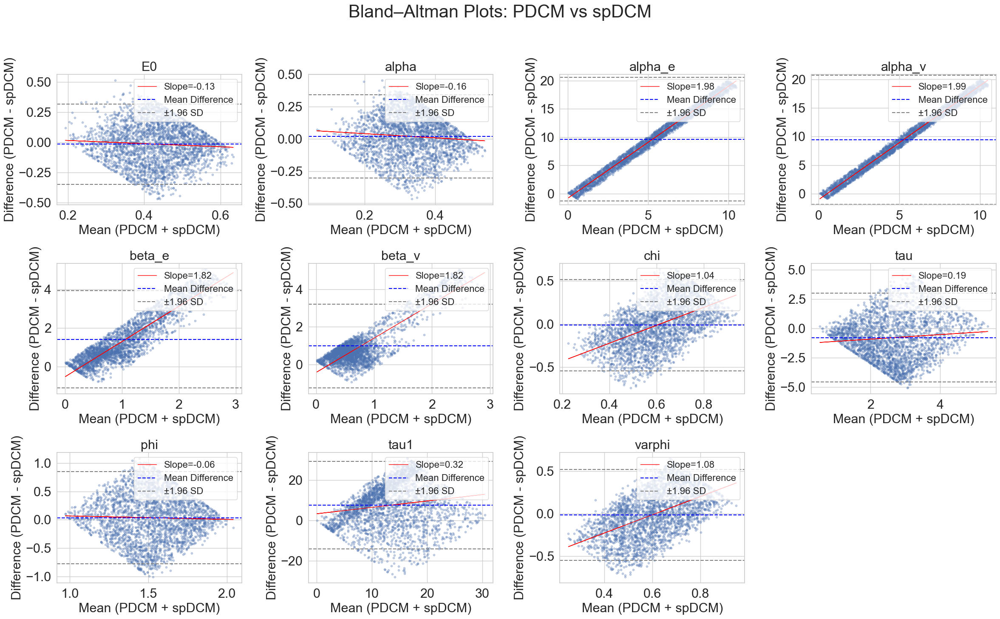

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib as mpl

mpl.rcParams.update({
    'font.size': 22,
    'axes.titlesize': 22,
    'axes.labelsize': 22,
    'xtick.labelsize': 22,
    'ytick.labelsize': 22,
    'legend.fontsize': 16,
    'figure.titlesize': 22
})


pdcm = pd.read_csv("pdcm_all_data.csv")
spdcm = pd.read_csv("spdcm_all_data.csv")

# Merge datasets
merged = pd.merge(
    pdcm, spdcm,
    on=["subject", "roi", "experiment", "parameter"],
    suffixes=("_PDCM", "_spDCM")
)

# Ensure numeric values
merged["value_PDCM"] = pd.to_numeric(merged["value_PDCM"], errors="coerce")
merged["value_spDCM"] = pd.to_numeric(merged["value_spDCM"], errors="coerce")
merged.dropna(subset=["value_PDCM", "value_spDCM"], inplace=True)


parameters = sorted(merged["parameter"].unique())
n_params = len(parameters)
n_cols = 4
n_rows = (n_params + n_cols - 1) // n_cols

param_title_map = {
    "mtt": "tau",
    "tau": "tau1"
}


fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 6, n_rows * 5))
axes = axes.flatten()


for i, param in enumerate(parameters):
    ax = axes[i]
    data = merged[merged["parameter"] == param]
    if len(data) < 10:
        ax.axis("off")
        continue

    x = data["value_PDCM"]
    y = data["value_spDCM"]
    mean_vals = (x + y) / 2
    diff_vals = x - y

    mean_diff = np.mean(diff_vals)
    std_diff = np.std(diff_vals, ddof=1)
    loa_upper = mean_diff + 1.96 * std_diff
    loa_lower = mean_diff - 1.96 * std_diff

    # Linear regression
    reg = LinearRegression().fit(mean_vals.values.reshape(-1, 1), diff_vals.values.reshape(-1, 1))
    trend = reg.predict(mean_vals.values.reshape(-1, 1))

    ax.scatter(mean_vals, diff_vals, alpha=0.3, s=10)
    ax.plot(mean_vals, trend, color='red', linewidth=1, label=f"Slope={reg.coef_[0][0]:.2f}")
    ax.axhline(mean_diff, color='blue', linestyle='--', label='Mean Difference')
    ax.axhline(loa_upper, color='gray', linestyle='--', label='±1.96 SD')
    ax.axhline(loa_lower, color='gray', linestyle='--')

    display_title = param_title_map.get(param, param)
    ax.set_title(display_title)
    ax.set_xlabel("Mean (PDCM + spDCM)")
    ax.set_ylabel("Difference (PDCM - spDCM)")
    ax.legend(loc="upper right")
    print(f"{param_title_map.get(param, param)}: mean difference = {mean_diff:.4f}")



for j in range(i + 1, len(axes)):
    axes[j].axis("off")


plt.suptitle("Bland–Altman Plots: PDCM vs spDCM", fontsize=30)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


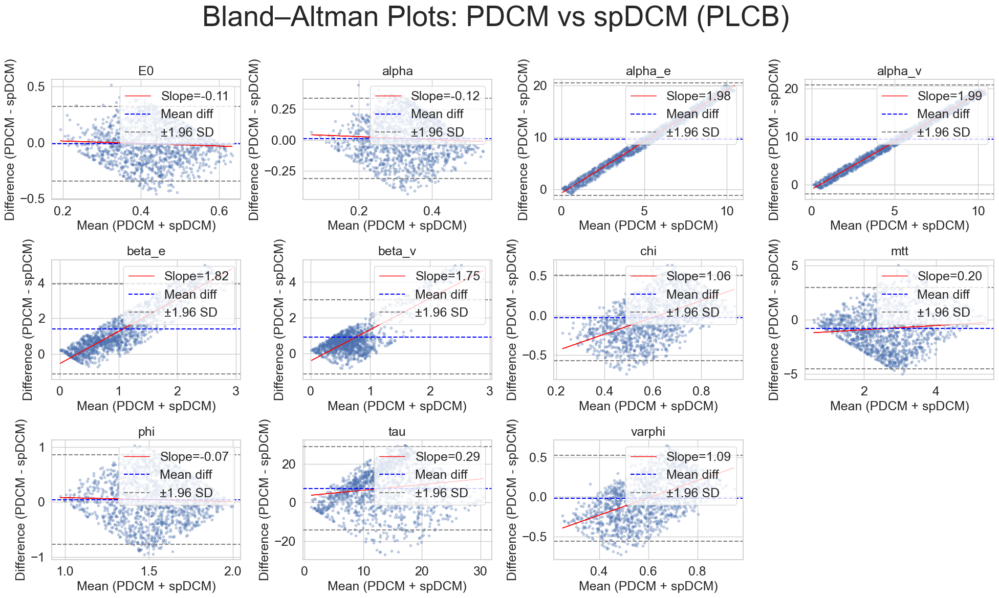

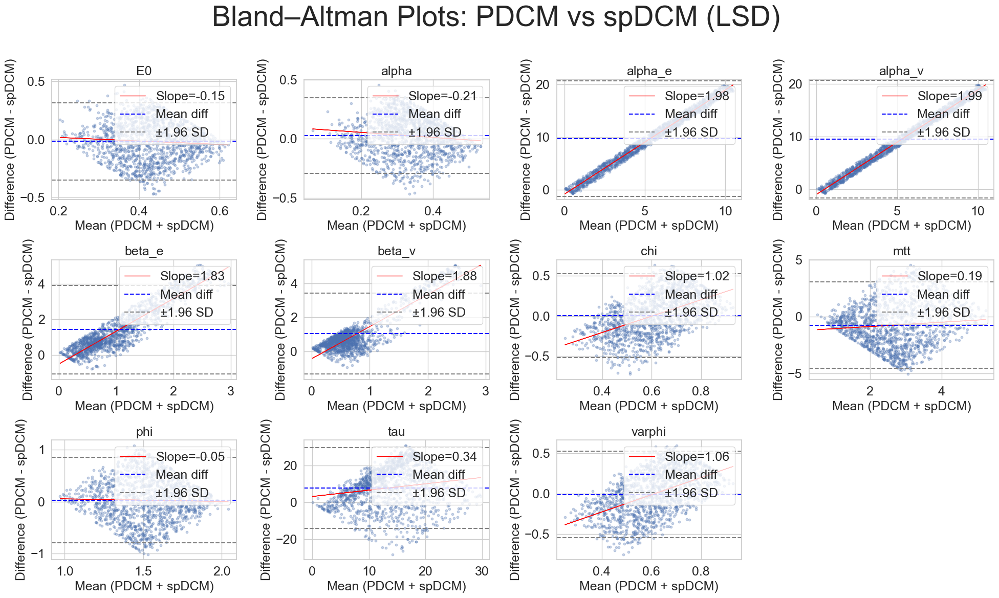

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib as mpl

mpl.rcParams.update({
    'font.size': 18,
    'axes.titlesize': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.fontsize': 18,
    'figure.titlesize': 20
})

pdcm = pd.read_csv("pdcm_all_data.csv")
spdcm = pd.read_csv("spdcm_all_data.csv")


merged = pd.merge(
    pdcm, spdcm,
    on=["subject", "roi", "experiment", "parameter"],
    suffixes=("_PDCM", "_spDCM")
)


merged["value_PDCM"] = pd.to_numeric(merged["value_PDCM"], errors="coerce")
merged["value_spDCM"] = pd.to_numeric(merged["value_spDCM"], errors="coerce")
merged.dropna(subset=["value_PDCM", "value_spDCM"], inplace=True)


parameters = sorted(merged["parameter"].unique())
n_params = len(parameters)
n_cols = 4
n_rows = (n_params + n_cols - 1) // n_cols


for condition in ["PLCB", "LSD"]:
    condition_data = merged[merged["experiment"] == condition]

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))
    axes = axes.flatten()

    for i, param in enumerate(parameters):
        ax = axes[i]
        data = condition_data[condition_data["parameter"] == param]
        if len(data) < 10:
            ax.axis("off")
            continue

        x = data["value_PDCM"]
        y = data["value_spDCM"]
        mean_vals = (x + y) / 2
        diff_vals = x - y
        mean_diff = np.mean(diff_vals)
        std_diff = np.std(diff_vals, ddof=1)
        loa_upper = mean_diff + 1.96 * std_diff
        loa_lower = mean_diff - 1.96 * std_diff

        # Regression
        reg = LinearRegression().fit(mean_vals.values.reshape(-1, 1), diff_vals.values.reshape(-1, 1))
        trend = reg.predict(mean_vals.values.reshape(-1, 1))

        ax.scatter(mean_vals, diff_vals, alpha=0.3, s=10)
        ax.plot(mean_vals, trend, color='red', linewidth=1, label=f"Slope={reg.coef_[0][0]:.2f}")
        ax.axhline(mean_diff, color='blue', linestyle='--', label='Mean diff')
        ax.axhline(loa_upper, color='gray', linestyle='--', label='±1.96 SD')
        ax.axhline(loa_lower, color='gray', linestyle='--')

        ax.legend(loc="upper right", fontsize=18)
        ax.set_title(param)
        ax.set_xlabel("Mean (PDCM + spDCM)")
        ax.set_ylabel("Difference (PDCM - spDCM)")

    # Turn off unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle(f"Bland–Altman Plots: PDCM vs spDCM ({condition})", fontsize=40)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()


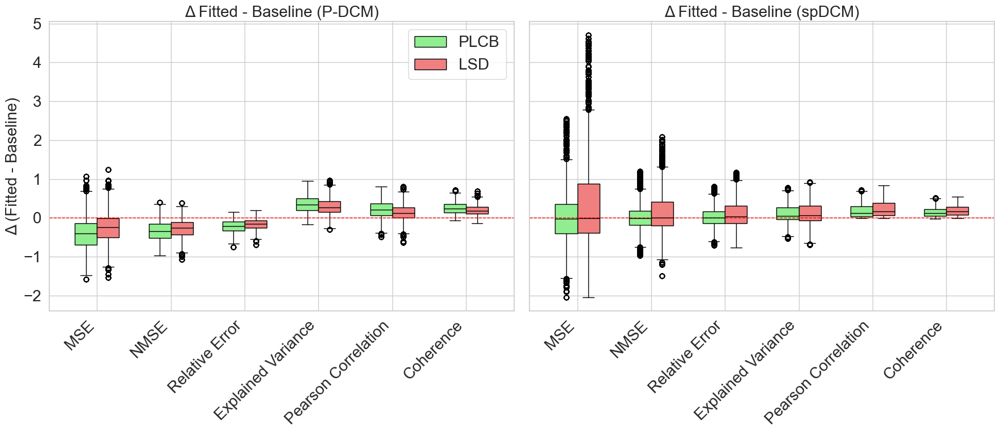

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_rel

pdcm = pd.read_csv("pdcm_all_data.csv")
spdcm = pd.read_csv("spdcm_all_data.csv")

metrics_to_use = ["mse", "nmse", "relative_error", "explained_variance", "pearson_corr", "coherence"]
metric_label_map = {
    "mse": "MSE",
    "nmse": "NMSE",
    "relative_error": "Relative Error",
    "explained_variance": "Explained Variance",
    "pearson_corr": "Pearson Correlation",
    "coherence": "Coherence"
}
display_labels = [metric_label_map[m] for m in metrics_to_use]
positions = np.arange(len(metrics_to_use))
width = 0.3
offset = width / 2

rows = []
for m in metrics_to_use:
    fitted_col = f"{m}_norm"
    baseline_col = f"baseline_{m}_norm"

    if fitted_col in pdcm.columns and baseline_col in pdcm.columns:
        for _, row in pdcm.iterrows():
            if pd.notna(row[fitted_col]) and pd.notna(row[baseline_col]):
                rows.append({
                    "subject": row["subject"],
                    "roi": row["roi"],
                    "condition": row["experiment"],
                    "metric": m,
                    "delta": row[fitted_col] - row[baseline_col]
                })

plot_data = pd.DataFrame(rows)

rows = []
for m in metrics_to_use:
    fitted_col = f"{m}_norm"
    baseline_col = f"baseline_{m}_norm"

    if fitted_col in spdcm.columns and baseline_col in spdcm.columns:
        for _, row in spdcm.iterrows():
            if pd.notna(row[fitted_col]) and pd.notna(row[baseline_col]):
                rows.append({
                    "subject": row["subject"],
                    "roi": row["roi"],
                    "experiment": row["experiment"],
                    "metric": m,
                    "delta": row[fitted_col] - row[baseline_col]
                })

metrics_df = pd.DataFrame(rows)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8), sharey=True)

positions_plcb = positions - offset
positions_lsd = positions + offset

# P-DCM
data_plcb_pdcm = [plot_data[(plot_data["metric"] == m) & (plot_data["condition"] == "PLCB")]["delta"].dropna()
                  for m in metrics_to_use]
data_lsd_pdcm = [plot_data[(plot_data["metric"] == m) & (plot_data["condition"] == "LSD")]["delta"].dropna()
                 for m in metrics_to_use]

bp1 = ax1.boxplot(data_plcb_pdcm, positions=positions_plcb, widths=width, patch_artist=True,
                  boxprops=dict(facecolor='lightgreen', color='black'),
                  medianprops=dict(color='black'))

bp2 = ax1.boxplot(data_lsd_pdcm, positions=positions_lsd, widths=width, patch_artist=True,
                  boxprops=dict(facecolor='lightcoral', color='black'),
                  medianprops=dict(color='black'))

ax1.axhline(0, color='red', linestyle='--', linewidth=1)
ax1.set_xticks(positions)
ax1.set_xticklabels(display_labels, fontsize=20, rotation=45, ha='right')
ax1.set_title("Δ Fitted - Baseline (P-DCM)", fontsize=20)
ax1.set_ylabel("Δ (Fitted - Baseline)", fontsize=20)
ax1.tick_params(labelsize=20)
ax1.legend([bp1["boxes"][0], bp2["boxes"][0]], ["PLCB", "LSD"], fontsize=20)

# spDCM
data_plcb_spdcm = []
data_lsd_spdcm = []

for metric in metrics_to_use:
    for cond, target_list in zip(["PLCB", "LSD"], [data_plcb_spdcm, data_lsd_spdcm]):
        subset = metrics_df[(metrics_df["metric"] == metric) & (metrics_df["experiment"] == cond)]
        if subset.empty:
            target_list.append([])
            continue
        Q1 = subset["delta"].quantile(0.25)
        Q3 = subset["delta"].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        non_outliers = subset[(subset["delta"] >= lower_bound) & (subset["delta"] <= upper_bound)]
        target_list.append(non_outliers["delta"].dropna())

bp3 = ax2.boxplot(data_plcb_spdcm, positions=positions_plcb, widths=width, patch_artist=True,
                  boxprops=dict(facecolor='lightgreen', color='black'),
                  medianprops=dict(color='black'))

bp4 = ax2.boxplot(data_lsd_spdcm, positions=positions_lsd, widths=width, patch_artist=True,
                  boxprops=dict(facecolor='lightcoral', color='black'),
                  medianprops=dict(color='black'))

ax2.axhline(0, color='red', linestyle='--', linewidth=1)
ax2.set_xticks(positions)
ax2.set_xticklabels(display_labels, fontsize=20, rotation=45, ha='right')
ax2.set_title("Δ Fitted - Baseline (spDCM)", fontsize=20)
ax2.tick_params(labelsize=20)

plt.tight_layout()
plt.show()


In [16]:
import numpy as np

# Calculate mean NMSE for P-DCM (fitted and baseline)
pdcm_nmse_fitted = pdcm["nmse_norm"].dropna()
pdcm_nmse_baseline = pdcm["baseline_nmse_norm"].dropna()

# Calculate mean NMSE for spDCM (fitted and baseline)
spdcm_nmse_fitted = spdcm["nmse_norm"].dropna()
spdcm_nmse_baseline = spdcm["baseline_nmse_norm"].dropna()

# Compute mean fitted NMSE across all data points
mean_nmse_pdcm = pdcm_nmse_fitted.mean()
mean_nmse_spdcm = spdcm_nmse_fitted.mean()

# Calculate relative improvement of P-DCM over spDCM
improvement_percent = 100 * (mean_nmse_spdcm - mean_nmse_pdcm) / mean_nmse_spdcm

print(f"Mean NMSE for P-DCM: {mean_nmse_pdcm:.4f}")
print(f"Mean NMSE for spDCM: {mean_nmse_spdcm:.4f}")
print(f"P-DCM achieves {improvement_percent:.2f}% lower NMSE than spDCM on average.")


Mean NMSE for P-DCM: 0.5904
Mean NMSE for spDCM: 1.7404
P-DCM achieves 66.08% lower NMSE than spDCM on average.


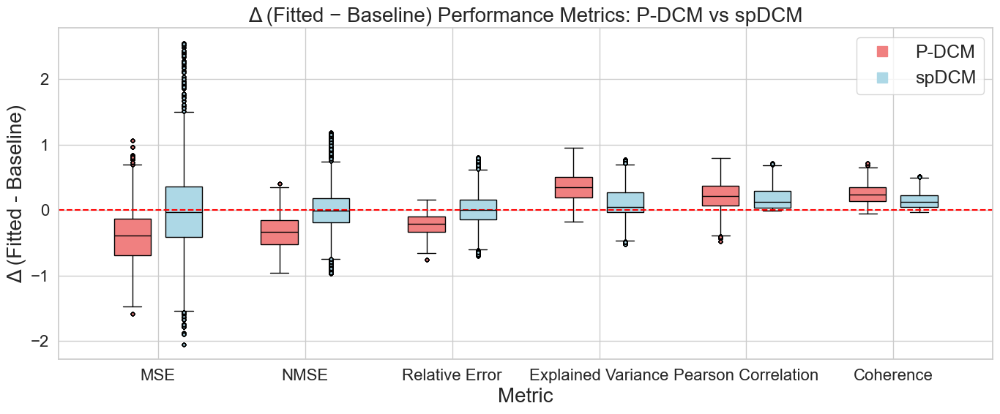

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

pdcm = pd.read_csv("pdcm_all_data.csv")
spdcm = pd.read_csv("spdcm_all_data.csv")

metrics_to_use = ["mse", "nmse", "relative_error", "explained_variance", "pearson_corr", "coherence"]
metric_label_map = {
    "mse": "MSE",
    "nmse": "NMSE",
    "relative_error": "Relative Error",
    "explained_variance": "Explained Variance",
    "pearson_corr": "Pearson Correlation",
    "coherence": "Coherence"
}
metric_labels = [metric_label_map[m] for m in metrics_to_use]

# Extract P-DCM deltas
def extract_pdcm_deltas(df):
    rows = {metric_label_map[m]: [] for m in metrics_to_use}
    for m in metrics_to_use:
        fitted_col = f"{m}_norm"
        baseline_col = f"baseline_{m}_norm"
        subset = df[(df["experiment"] == "PLCB") & df[fitted_col].notna() & df[baseline_col].notna()]
        deltas = subset[fitted_col] - subset[baseline_col]
        rows[metric_label_map[m]] = deltas.tolist()
    return rows

# Extract spDCM deltas (with IQR filtering)
def extract_spdcm_deltas(df):
    rows = {metric_label_map[m]: [] for m in metrics_to_use}
    for m in metrics_to_use:
        fitted_col = f"{m}_norm"
        baseline_col = f"baseline_{m}_norm"
        subset = df[(df["experiment"] == "PLCB") & df[fitted_col].notna() & df[baseline_col].notna()]
        deltas = subset[fitted_col] - subset[baseline_col]
        Q1 = deltas.quantile(0.25)
        Q3 = deltas.quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR
        filtered = deltas[(deltas >= lower) & (deltas <= upper)]
        rows[metric_label_map[m]] = filtered.tolist()
    return rows

# Collect data
pdcm_data = extract_pdcm_deltas(pdcm)
spdcm_data = extract_spdcm_deltas(spdcm)

plt.figure(figsize=(14, 6))
positions = np.arange(len(metrics_to_use))
width = 0.35

# P-DCM boxes
for i, m in enumerate(metric_labels):
    plt.boxplot(pdcm_data[m],
                positions=[positions[i] - width / 2],
                widths=0.25,
                patch_artist=True,
                boxprops=dict(facecolor='lightcoral', color='black'),
                medianprops=dict(color='black'),
                whiskerprops=dict(color='black'),
                capprops=dict(color='black'),
                flierprops=dict(markerfacecolor='lightcoral', markersize=3))

# spDCM boxes
for i, m in enumerate(metric_labels):
    plt.boxplot(spdcm_data[m],
                positions=[positions[i] + width / 2],
                widths=0.25,
                patch_artist=True,
                boxprops=dict(facecolor='lightblue', color='black'),
                medianprops=dict(color='black'),
                whiskerprops=dict(color='black'),
                capprops=dict(color='black'),
                flierprops=dict(markerfacecolor='lightblue', markersize=3))

plt.axhline(0, color='red', linestyle='--')
plt.xticks(positions, metric_labels, fontsize=16)
plt.yticks(fontsize=16)
plt.ylabel("Δ (Fitted - Baseline)", fontsize=20)
plt.title("Δ (Fitted − Baseline) Performance Metrics: P-DCM vs spDCM", fontsize=20)
plt.xlabel("Metric", fontsize=20)

plt.plot([], [], color='lightcoral', marker='s', markersize=10, label='P-DCM', linestyle='None')
plt.plot([], [], color='lightblue', marker='s', markersize=10, label='spDCM', linestyle='None')
plt.legend(fontsize=18)

plt.tight_layout()
plt.show()


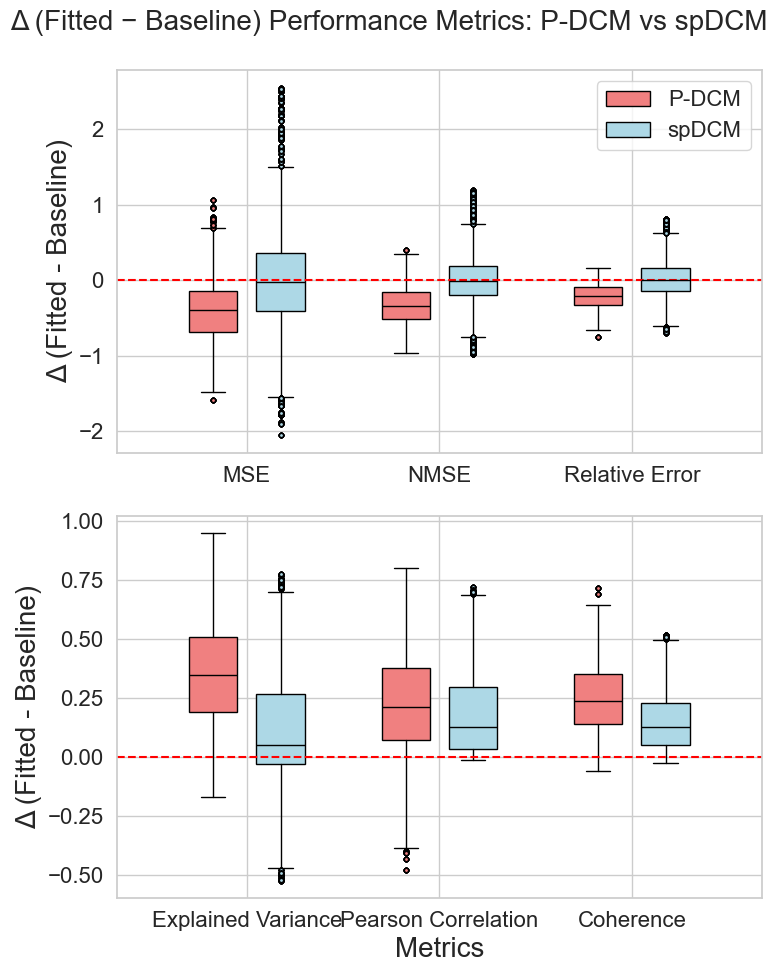

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


pdcm = pd.read_csv("pdcm_all_data.csv")
spdcm = pd.read_csv("spdcm_all_data.csv")

metrics_top = ["mse", "nmse", "relative_error"]
metrics_bottom = ["explained_variance", "pearson_corr", "coherence"]

metric_label_map = {
    "mse": "MSE",
    "nmse": "NMSE",
    "relative_error": "Relative Error",
    "explained_variance": "Explained Variance",
    "pearson_corr": "Pearson Correlation",
    "coherence": "Coherence"
}

def extract_pdcm_deltas(df, metrics):
    rows = {metric_label_map[m]: [] for m in metrics}
    for m in metrics:
        fitted_col = f"{m}_norm"
        baseline_col = f"baseline_{m}_norm"
        subset = df[(df["experiment"] == "PLCB") & df[fitted_col].notna() & df[baseline_col].notna()]
        deltas = subset[fitted_col] - subset[baseline_col]
        rows[metric_label_map[m]] = deltas.tolist()
    return rows

def extract_spdcm_deltas(df, metrics):
    rows = {metric_label_map[m]: [] for m in metrics}
    for m in metrics:
        fitted_col = f"{m}_norm"
        baseline_col = f"baseline_{m}_norm"
        subset = df[(df["experiment"] == "PLCB") & df[fitted_col].notna() & df[baseline_col].notna()]
        deltas = subset[fitted_col] - subset[baseline_col]
        Q1 = deltas.quantile(0.25)
        Q3 = deltas.quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR
        filtered = deltas[(deltas >= lower) & (deltas <= upper)]
        rows[metric_label_map[m]] = filtered.tolist()
    return rows

pdcm_top = extract_pdcm_deltas(pdcm, metrics_top)
spdcm_top = extract_spdcm_deltas(spdcm, metrics_top)

pdcm_bot = extract_pdcm_deltas(pdcm, metrics_bottom)
spdcm_bot = extract_spdcm_deltas(spdcm, metrics_bottom)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 10), sharey=False)

width = 0.35


labels_top = [metric_label_map[m] for m in metrics_top]
positions_top = np.arange(len(labels_top))

for i, m in enumerate(labels_top):
    ax1.boxplot(pdcm_top[m],
                positions=[positions_top[i] - width / 2],
                widths=0.25,
                patch_artist=True,
                boxprops=dict(facecolor='lightcoral', color='black'),
                medianprops=dict(color='black'),
                flierprops=dict(markerfacecolor='lightcoral', markersize=3))

    ax1.boxplot(spdcm_top[m],
                positions=[positions_top[i] + width / 2],
                widths=0.25,
                patch_artist=True,
                boxprops=dict(facecolor='lightblue', color='black'),
                medianprops=dict(color='black'),
                flierprops=dict(markerfacecolor='lightblue', markersize=3))

ax1.axhline(0, color='red', linestyle='--')
ax1.set_xticks(positions_top)
ax1.set_xticklabels(labels_top, fontsize=16)
ax1.tick_params(axis='y', labelsize=16)
ax1.set_ylabel("Δ (Fitted - Baseline)", fontsize=20)
ax1.legend(["P-DCM", "spDCM"], loc="upper right", fontsize=16)

labels_bot = [metric_label_map[m] for m in metrics_bottom]
positions_bot = np.arange(len(labels_bot))

for i, m in enumerate(labels_bot):
    ax2.boxplot(pdcm_bot[m],
                positions=[positions_bot[i] - width / 2],
                widths=0.25,
                patch_artist=True,
                boxprops=dict(facecolor='lightcoral', color='black'),
                medianprops=dict(color='black'),
                flierprops=dict(markerfacecolor='lightcoral', markersize=3))

    ax2.boxplot(spdcm_bot[m],
                positions=[positions_bot[i] + width / 2],
                widths=0.25,
                patch_artist=True,
                boxprops=dict(facecolor='lightblue', color='black'),
                medianprops=dict(color='black'),
                flierprops=dict(markerfacecolor='lightblue', markersize=3))

ax2.axhline(0, color='red', linestyle='--')
ax2.set_xticks(positions_bot)
ax2.set_xticklabels(labels_bot, fontsize=16)
ax2.tick_params(axis='y', labelsize=16)
ax2.set_ylabel("Δ (Fitted - Baseline)", fontsize=20)
ax2.set_xlabel("Metrics", fontsize=20)

fig.suptitle("Δ (Fitted − Baseline) Performance Metrics: P-DCM vs spDCM", fontsize=20)
plt.tight_layout()
plt.show()


/var/folders/0j/8rw9s9dd56v924gjnszhk07m0000gn/T/ipykernel_11701/116695481.py:71: FutureWarning: In the future `np.bool` will be defined as the corresponding NumPy scalar.
  if not hasattr(np, 'bool'):
/var/folders/0j/8rw9s9dd56v924gjnszhk07m0000gn/T/ipykernel_11701/116695481.py:125: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.96])


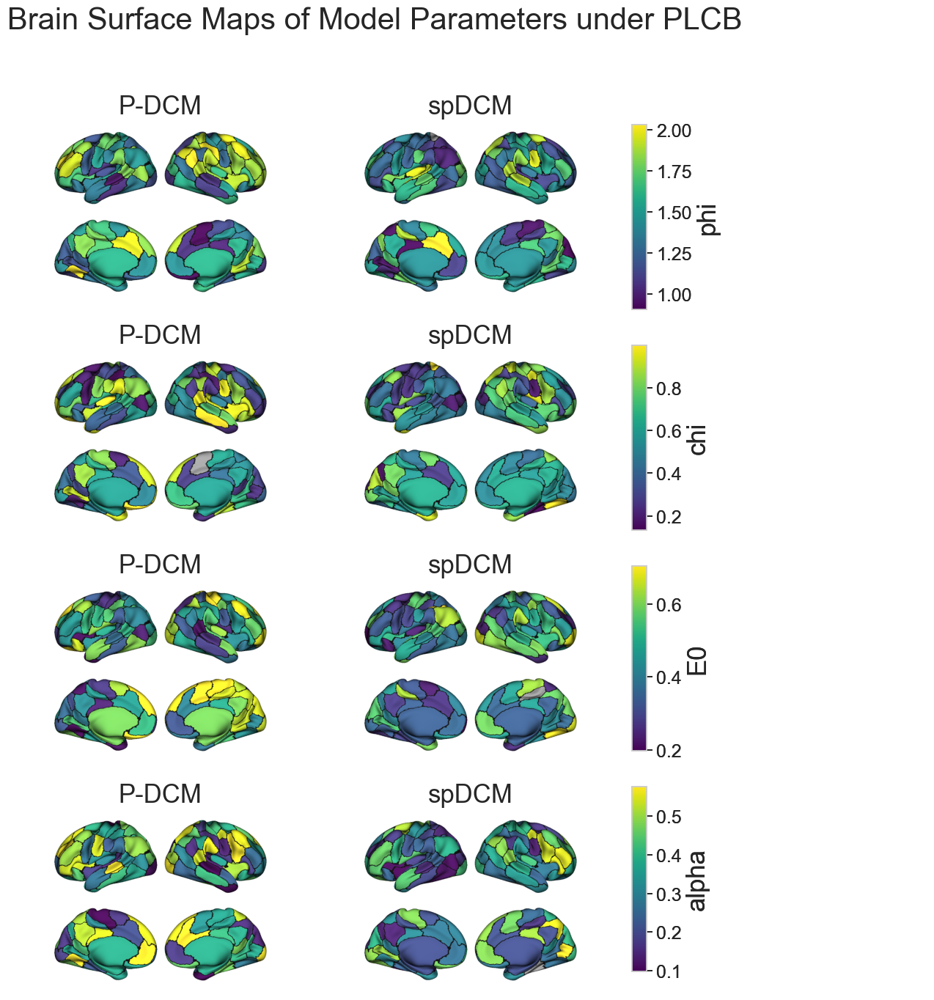

In [ ]:
import os
import io
import math
import json
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from neuromaps.datasets import fetch_fslr
from brainspace.datasets import load_parcellation
from surfplot import Plot
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

subject_ids = {"PDCM": 2, "spDCM": 2}
base_dirs = {
    "PDCM": "/Users/xuenbei/Desktop/finalyearproject/PDCM/fitted_data",
    "spDCM": "/Users/xuenbei/Desktop/finalyearproject/spDCM/fitted_data"
}
condition = "PLCB"
n_rois = 100
param_subset = ["phi", "chi", "E0", "alpha"] 

param_name_map = {
    "tau": "tau1",  
    "mtt": "tau",
    "lamb": "lambda"
}
model_name_map = {"PDCM": "P-DCM", "spDCM": "spDCM"}
lh_surf, rh_surf = fetch_fslr()["inflated"]
lh_parc, rh_parc = load_parcellation("schaefer", scale=n_rois)

n_params = len(param_subset)
fig, axs = plt.subplots(n_params, 3, figsize=(13, 3.5 * n_params))
if n_params == 1:
    axs = axs.reshape(1, 3)

for i, parameter in enumerate(param_subset):
    brain_data = {}

    for model in ["PDCM", "spDCM"]:
        sid = subject_ids[model]
        sdir = os.path.join(base_dirs[model], f"sub-{sid:03d}")
        values = np.full(n_rois, np.nan)

        for roi in range(n_rois):
            fpath = os.path.join(sdir, f"roi-{roi}-{condition}_results.json")
            if os.path.exists(fpath):
                with open(fpath, "r") as f:
                    data = json.load(f)
                    val = data.get("final_parameters", {}).get(parameter, None)
                    if val is not None:
                        try:
                            values[roi] = float(np.array(val).flatten()[0])
                        except:
                            pass

        lh_data = np.zeros_like(lh_parc, dtype=float)
        rh_data = np.zeros_like(rh_parc, dtype=float)
        for label in np.unique(lh_parc):
            idx = label - 1
            if idx < len(values):
                lh_data[lh_parc == label] = values[idx]
        for label in np.unique(rh_parc):
            idx = label - 1
            if idx < len(values):
                rh_data[rh_parc == label] = values[idx]

        brain_data[model] = {"lh": lh_data, "rh": rh_data}

        if not hasattr(np, 'bool'):
                np.bool = bool
            
    # Get vmin/vmax per parameter
    all_vals = np.concatenate([
        brain_data["PDCM"]["lh"], brain_data["PDCM"]["rh"],
        brain_data["spDCM"]["lh"], brain_data["spDCM"]["rh"]
    ])
    vmin, vmax = np.nanmin(all_vals), np.nanmax(all_vals)
    norm = Normalize(vmin=vmin, vmax=vmax)

    for j, model in enumerate(["PDCM", "spDCM"]):
        plot = Plot(lh_surf, rh_surf, views=["lateral", "medial"])
    
        lh_plot_data = (brain_data[model]["lh"] - vmin) / (vmax - vmin)
        rh_plot_data = (brain_data[model]["rh"] - vmin) / (vmax - vmin)
    
        plot.add_layer(
            {"left": lh_plot_data, "right": rh_plot_data},
            cmap="viridis", cbar=False
        )
        plot.add_layer({"left": lh_parc, "right": rh_parc}, cmap="gray", as_outline=True, cbar=False)
    
        fig_tmp = plot.build()
    
        buf = io.BytesIO()
        fig_tmp.savefig(buf, format="png", bbox_inches="tight", dpi=150)
        buf.seek(0)
        img = Image.open(buf)
        axs[i, j].set_title(model_name_map[model], fontsize=25)
        axs[i, j].imshow(img)
        axs[i, j].axis("off")
        plt.close(fig_tmp)


        # Turn off unused subplot
        axs[i, 2].axis("off")
        
        cbar_height = 0.18
        spacing = 0.035
        total_height = n_params * (cbar_height + spacing)
        
        bottom = 1 - (i + 1) * (cbar_height + spacing) - 0.1
        
        bottom = max(0, bottom)
        
        cbar_ax = fig.add_axes([0.67, bottom, 0.015, cbar_height])
        cb = plt.colorbar(ScalarMappable(norm=norm, cmap="viridis"), cax=cbar_ax)
        cb.ax.tick_params(labelsize=18)
        cb.set_label(param_name_map.get(parameter, parameter), fontsize=25)

                

fig.suptitle("Brain Surface Maps of Model Parameters under PLCB", fontsize=30, x=0.4)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


/var/folders/0j/8rw9s9dd56v924gjnszhk07m0000gn/T/ipykernel_11701/4160547778.py:120: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.96])


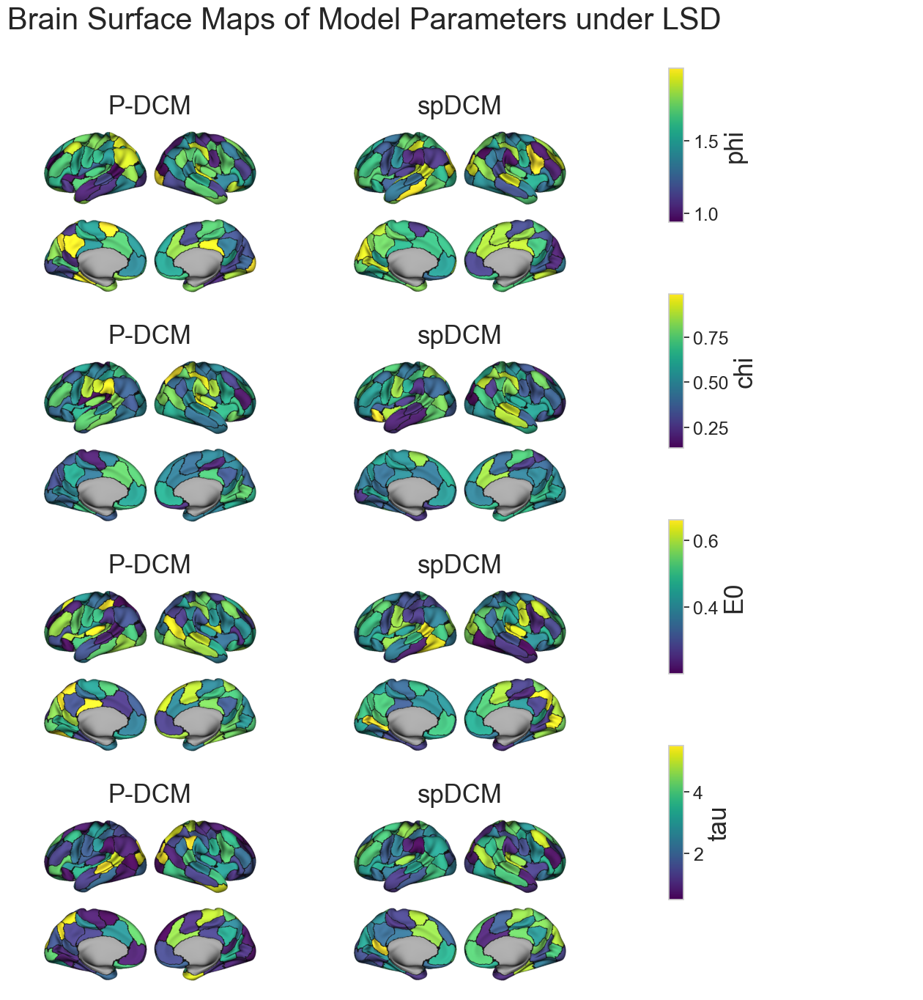

In [ ]:
import os
import io
import json
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from neuromaps.datasets import fetch_fslr
from brainspace.datasets import load_parcellation
from surfplot import Plot
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

if not hasattr(np, 'bool'):
    np.bool = bool

subject_ids = {"PDCM": 3, "spDCM": 3}
base_dirs = {
    "PDCM": "/Users/xuenbei/Desktop/finalyearproject/PDCM/fitted_data",
    "spDCM": "/Users/xuenbei/Desktop/finalyearproject/spDCM/fitted_data"
}
condition = "LSD"
n_rois = 100
param_subset = ["phi", "chi", "E0", "mtt"]

param_name_map = {
    "tau": "tau1",
    "mtt": "tau",
    "lamb": "lambda"
}
model_name_map = {"PDCM": "P-DCM", "spDCM": "spDCM"}

# Load surfaces and parcellations
lh_surf, rh_surf = fetch_fslr()["inflated"]
lh_parc, rh_parc = load_parcellation("schaefer", scale=n_rois)

n_params = len(param_subset)
fig, axs = plt.subplots(n_params, 3, figsize=(13, 3.5 * n_params))
if n_params == 1:
    axs = axs.reshape(1, 3)

# Loop through each parameter
for i, parameter in enumerate(param_subset):
    brain_data = {}

    for model in ["PDCM", "spDCM"]:
        sid = subject_ids[model]
        sdir = os.path.join(base_dirs[model], f"sub-{sid:03d}")
        values = np.full(n_rois, np.nan)

        for roi in range(n_rois):
            fpath = os.path.join(sdir, f"roi-{roi}-{condition}_results.json")
            if os.path.exists(fpath):
                try:
                    with open(fpath, "r") as f:
                        data = json.load(f)
                        val = data.get("final_parameters", {}).get(parameter, None)
                        if val is not None:
                            values[roi] = float(np.array(val).flatten()[0])
                except Exception as e:
                    print(f"[ERROR] Failed to parse {fpath}: {e}")

        # Map ROI values to surface data
        lh_data = np.full_like(lh_parc, np.nan, dtype=float)
        rh_data = np.full_like(rh_parc, np.nan, dtype=float)

        for label in np.unique(lh_parc):
            if 1 <= label <= n_rois:
                lh_data[lh_parc == label] = values[label - 1]

        for label in np.unique(rh_parc):
            if 1 <= label <= n_rois:
                rh_data[rh_parc == label] = values[label - 1]

        brain_data[model] = {"lh": lh_data, "rh": rh_data}

    # Normalise across both models
    all_vals = np.concatenate([
        brain_data["PDCM"]["lh"], brain_data["PDCM"]["rh"],
        brain_data["spDCM"]["lh"], brain_data["spDCM"]["rh"]
    ])
    vmin, vmax = np.nanmin(all_vals), np.nanmax(all_vals)
    norm = Normalize(vmin=vmin, vmax=vmax)

    # Plot each model
    for j, model in enumerate(["PDCM", "spDCM"]):
        plot = Plot(lh_surf, rh_surf, views=["lateral", "medial"])
        plot.add_layer(
            {"left": brain_data[model]["lh"], "right": brain_data[model]["rh"]},
            cmap="viridis", cbar=False
        )
        plot.add_layer(
            {"left": lh_parc, "right": rh_parc},
            cmap="gray", as_outline=True, cbar=False
        )

        # Render and embed in subplot
        fig_tmp = plot.build()
        buf = io.BytesIO()
        fig_tmp.savefig(buf, format="png", bbox_inches="tight", dpi=150)
        buf.seek(0)
        img = Image.open(buf)
        axs[i, j].imshow(img)
        axs[i, j].set_title(model_name_map[model], fontsize=25)
        axs[i, j].axis("off")
        plt.close(fig_tmp)

    # Turn off unused third column
    axs[i, 2].axis("off")

    cbar_ax = fig.add_axes([0.72, 0.77 - i * 0.22, 0.015, 0.15])
    cb = plt.colorbar(ScalarMappable(norm=norm, cmap="viridis"), cax=cbar_ax)
    cb.ax.tick_params(labelsize=18)
    cb.set_label(param_name_map.get(parameter, parameter), fontsize=25)

fig.suptitle("Brain Surface Maps of Model Parameters under LSD", fontsize=30, x=0.4)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


/var/folders/0j/8rw9s9dd56v924gjnszhk07m0000gn/T/ipykernel_11701/3176477303.py:136: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.96])


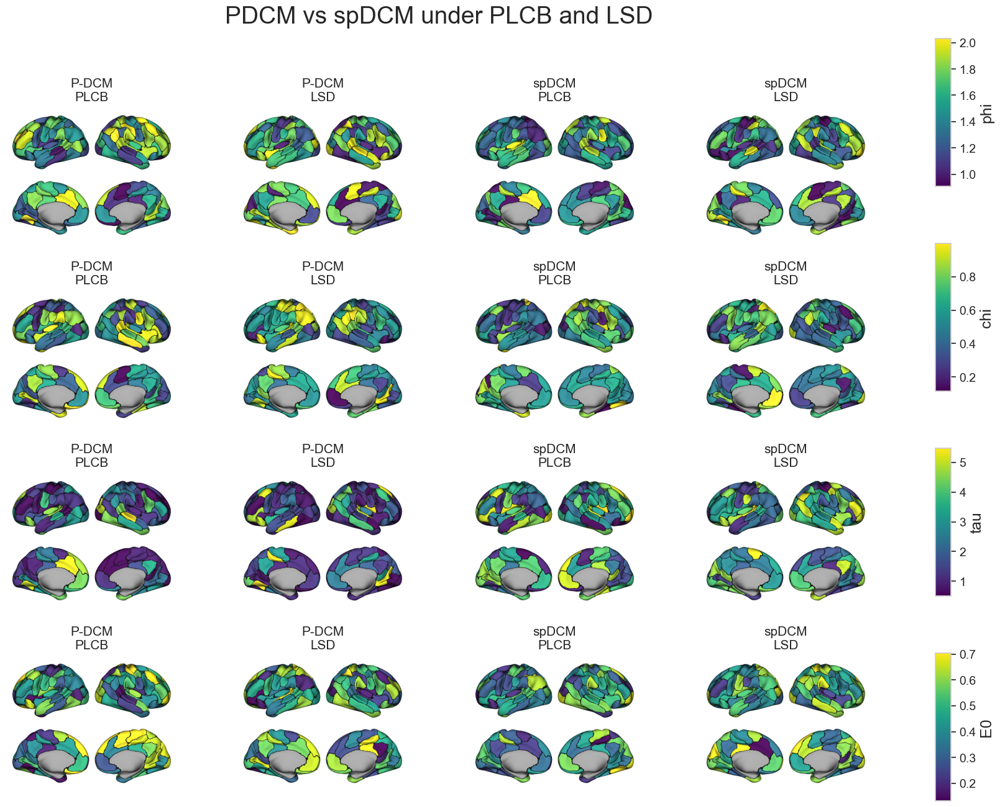

In [ ]:
import os
import io
import json
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from neuromaps.datasets import fetch_fslr
from brainspace.datasets import load_parcellation
from surfplot import Plot
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

if not hasattr(np, 'bool'):
    np.bool = bool

subject_id = 2
n_rois = 100
conditions = ["PLCB", "LSD"]
models = ["PDCM", "spDCM"]
param_subset = ["phi", "chi", "mtt", "E0"]

subject_ids = {model: subject_id for model in models}
base_dirs = {
    "PDCM": "/Users/xuenbei/Desktop/finalyearproject/PDCM/fitted_data",
    "spDCM": "/Users/xuenbei/Desktop/finalyearproject/spDCM/fitted_data"
}
param_name_map = {
    "tau": "tau1",
    "mtt": "tau",
    "lamb": "lambda"
}
model_name_map = {"PDCM": "P-DCM", "spDCM": "spDCM"}

# Load surfaces and parcellations
lh_surf, rh_surf = fetch_fslr()["inflated"]
lh_parc, rh_parc = load_parcellation("schaefer", scale=n_rois)

n_params = len(param_subset)
fig, axs = plt.subplots(n_params, 4, figsize=(17, 3.3 * n_params))
if n_params == 1:
    axs = axs.reshape(1, 4)

for i, parameter in enumerate(param_subset):
    brain_data = {}

    for model in models:
        sid = subject_ids[model]
        for cond in conditions:
            key = f"{model}_{cond}"
            subject_dir = os.path.join(base_dirs[model], f"sub-{sid:03d}")
            values = np.full(n_rois, np.nan)

            # Load values from JSON files
            for roi in range(n_rois):
                fpath = os.path.join(subject_dir, f"roi-{roi}-{cond}_results.json")
                if os.path.exists(fpath):
                    try:
                        with open(fpath, "r") as f:
                            data = json.load(f)
                            val = data.get("final_parameters", {}).get(parameter, None)
                            if val is not None:
                                values[roi] = float(np.array(val).flatten()[0])
                            else:
                                print(f"[WARN] Missing '{parameter}' in {fpath}")
                    except Exception as e:
                        print(f"[ERROR] Failed to load {fpath}: {e}")

            # Map values to cortical surface
            lh_data = np.full_like(lh_parc, np.nan, dtype=float)
            rh_data = np.full_like(rh_parc, np.nan, dtype=float)

            for label in np.unique(lh_parc):
                if 1 <= label <= n_rois:
                    idx = label - 1
                    lh_data[lh_parc == label] = values[idx]

            for label in np.unique(rh_parc):
                if 1 <= label <= n_rois:
                    idx = label - 1
                    rh_data[rh_parc == label] = values[idx]

            brain_data[key] = {"lh": lh_data, "rh": rh_data}

    # Normalise for color mapping
    all_vals = np.concatenate([
        brain_data[k]["lh"] for k in brain_data
    ] + [
        brain_data[k]["rh"] for k in brain_data
    ])
    vmin, vmax = np.nanmin(all_vals), np.nanmax(all_vals)
    norm = Normalize(vmin=vmin, vmax=vmax)

    # Plot parameter data and outlines
    for j, (model, cond) in enumerate([(m, c) for m in models for c in conditions]):
        key = f"{model}_{cond}"
        plot = Plot(lh_surf, rh_surf, views=["lateral", "medial"])

        # Parameter values layer
        plot.add_layer(
            {"left": brain_data[key]["lh"], "right": brain_data[key]["rh"]},
            cmap="viridis", cbar=False
        )
        # Parcellation outline layer
        plot.add_layer(
            {"left": lh_parc, "right": rh_parc},
            cmap="gray", as_outline=True, cbar=False
        )

        fig_tmp = plot.build()
        for ax in fig_tmp.axes:
            if "colorbar" in str(type(ax)).lower():
                fig_tmp.delaxes(ax)
            else:
                ax.set_title("")
        fig_tmp.suptitle("")

        # Convert to image for subplot
        buf = io.BytesIO()
        fig_tmp.savefig(buf, format="png", bbox_inches="tight", dpi=150)
        buf.seek(0)
        img = Image.open(buf)
        axs[i, j].imshow(img)
        axs[i, j].axis("off")
        axs[i, j].set_title(f"{model_name_map[model]}\n{cond}", fontsize=15)
        plt.close(fig_tmp)

    # Colorbar for each parameter
    cbar_ax = fig.add_axes([0.92, 1 - (i + 1) / n_params + 0.01, 0.015, 0.18])
    cb = plt.colorbar(ScalarMappable(norm=norm, cmap="viridis"), cax=cbar_ax)
    cb.ax.tick_params(labelsize=14)
    cb.set_label(param_name_map.get(parameter, parameter), fontsize=18)

fig.suptitle("PDCM vs spDCM under PLCB and LSD", fontsize=28, x=0.45)
plt.tight_layout(rect=[0, 0, 0.9, 0.96])
plt.show()
